In [1]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *

# Documentation 


We got CNV data from 3 softwares; CNVnator, QDNASeq and WiseCondor for the 279 samples of Simmons diversity project.
    
The 279 files of CNVs from CNVnator were merged with this command: 
```
!awk 'BEGIN{OFS="\t"} {print FILENAME,$0}' * > CNVnator_results.txt ```

in /branchinecta/jbazanwilliamson/CNVnator directory 


Telomeres and centromeres coordinates were extracted in Genome Table Browser

Gene anotation was extracted in Genome Table Browser(GENECODE V39/KnownGene)

In [2]:
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)
telomeres = pd.read_table('../data/telomere_hg38')
centromeres = pd.read_table('../data/centromeres_hg38')
hm3_cnv_data = pd.read_table('../data/hm3_cnv_submission.txt')
header_list = ['SAMPLE_NAME','TYPE', 'POSITION', 'LENGHT', 'RD', 'T-TEST-EVAL', 'GAUSSIAN-EVAL', 'T-TEST-EVAL(MIDDLE)','GAUSSIAN-EVAL(MIDDLE)', 'FRAQ-READ-QUALITY' ]
cnvnator_data = pd.read_table('/home/jbazanwilliamson/borgstore/branchinecta/jbazanwilliamson/CNVnator/CNVnator_results.txt', names=header_list)

telomeres['chrom'] = telomeres['chrom'].str.replace('chr', '')


centromeres['chrom'] = centromeres['chrom'].str.replace('chr', '')

#Table browser is 0-based coordinates, changed to 1-based for compability with CNV data
telomeres['chromStart'] = telomeres['chromStart'] + 1

centromeres['chromStart'] = centromeres['chromStart'] + 1

hm3_cnv_data['chr'] = hm3_cnv_data['chr'].astype(str)

black_header = ['chr','start', 'end', 'type']
blacklist = pd.read_table('/home/jbazanwilliamson/borgstore/branchinecta/jbazanwilliamson/bin_anotation/hg19-blacklist.v2.bed', names=black_header)
blacklist['chr'] = blacklist['chr'].str.replace('chr', '')

cnvnator_data

,SAMPLE_NAME,TYPE,POSITION,LENGHT,RD,T-TEST-EVAL,GAUSSIAN-EVAL,T-TEST-EVAL(MIDDLE),GAUSSIAN-EVAL(MIDDLE),FRAQ-READ-QUALITY
0,LP6005441-DNA_A01,deletion,1:1-10000,10000.0,0.000000,1.593730e-11,0.000000e+00,1.992160e-11,0.000000e+00,-1
1,LP6005441-DNA_A01,duplication,1:11601-18400,6800.0,1.885520,0.000000e+00,2.870330e+09,1.644770e-04,2.870520e+09,1
2,LP6005441-DNA_A01,deletion,1:39901-48200,8300.0,0.491248,1.920150e-11,1.170970e+04,2.529720e-11,2.329250e+05,1
3,LP6005441-DNA_A01,deletion,1:49001-49700,700.0,0.440000,1.171230e+02,1.951650e-05,1.000000e+00,1.000000e+00,1
4,LP6005441-DNA_A01,deletion,1:51201-64200,13000.0,0.269762,1.225940e-11,7.811940e+03,1.448840e-11,5.609900e+04,1
...,...,...,...,...,...,...,...,...,...,...
2652100,SS6004480,duplication,hs37d5:35449101-35452500,3400.0,6.142330,1.571380e-02,8.098350e-02,2.307510e+01,1.300360e+05,1
2652101,SS6004480,duplication,hs37d5:35453501-35458700,5200.0,5.218620,6.135840e-08,1.654080e+09,1.479150e-03,2.411220e-98,1
2652102,SS6004480,deletion,hs37d5:35459001-35460200,1200.0,0.370035,2.871320e-01,3.368600e-05,1.000000e+00,1.000000e+00,1
2652103,SS6004480,deletion,hs37d5:35463501-35464600,1100.0,0.507767,8.729140e-01,4.879000e-04,1.000000e+00,1.000000e+00,1


,SAMPLE_NAME,TYPE,POSITION,LENGHT,RD,T-TEST-EVAL,GAUSSIAN-EVAL,T-TEST-EVAL(MIDDLE),GAUSSIAN-EVAL(MIDDLE),FRAQ-READ-QUALITY
1498,LP6005441-DNA_A01,duplication,5:10001-11800,1800.0,96.0883,0.000036,0.000000e+00,1.000000e+00,1.000000e+00,1
1876,LP6005441-DNA_A01,duplication,6:58776201-58779800,3600.0,240.9260,0.000070,8.625340e-114,6.149640e+00,0.000000e+00,1
2549,LP6005441-DNA_A01,duplication,8:46847801-46851800,4000.0,91.0099,0.049930,4.055890e+06,9.104630e+00,1.426030e+04,1
4639,LP6005441-DNA_A01,duplication,16:46385801-46435600,49800.0,105.1270,0.000000,2.562190e+09,0.000000e+00,2.573930e+09,1
5714,LP6005441-DNA_A01,duplication,X:58567001-58582000,15000.0,69.7822,0.000000,2.159930e-147,0.000000e+00,1.415530e-126,1
...,...,...,...,...,...,...,...,...,...,...
2651609,SS6004480,duplication,hs37d5:27031901-27049400,17500.0,54.8327,0.000448,8.002610e+08,6.121430e-04,9.260570e+08,1
2651652,SS6004480,duplication,hs37d5:27807801-27819700,11900.0,52.1034,0.000138,2.434700e+09,1.443290e-02,2.503090e+09,1
2651657,SS6004480,duplication,hs37d5:27899201-27917100,17900.0,51.9522,0.000035,3.555200e-03,7.008020e-05,0.000000e+00,1
2651709,SS6004480,duplication,hs37d5:29143101-29155600,12500.0,56.5016,0.000169,2.573310e+09,2.724670e-02,2.618780e+09,1


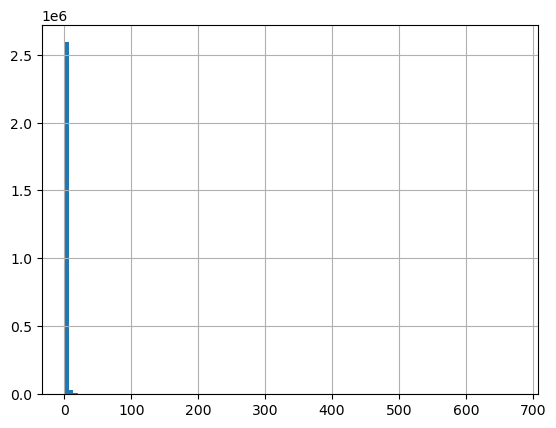

In [3]:
cnvnator_data['RD'].hist(bins=100)
#cnvnator_data['T-TEST-EVAL'].hist(bins=100)
cnvnator_data['LENGHT'].describe()

cnvnator_data[cnvnator_data['RD'] > 50]

## Filtration


<AxesSubplot:>

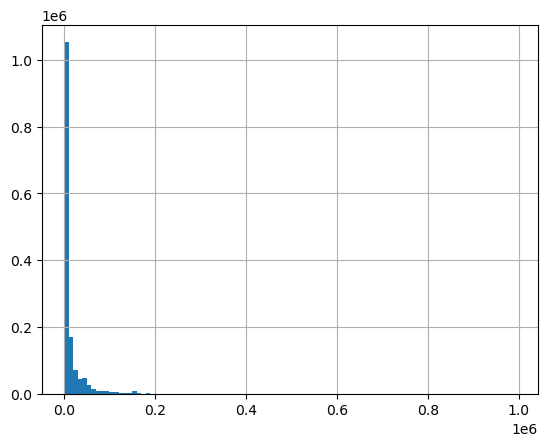

In [4]:
#FILTRATION BY SIGNIFICANCE 

cnvnator_data = cnvnator_data[cnvnator_data['T-TEST-EVAL'] <= 0.05]
#cnvnator_data = cnvnator_data[cnvnator_data['T-TEST-EVAL(MIDDLE)'] <= 5.14E-11]

cnvnator_data = cnvnator_data[cnvnator_data['LENGHT'] > 1000] #more than 1kb 
cnvnator_data = cnvnator_data.loc[(cnvnator_data['LENGHT'] < 1000000),:] #less than 1 Mb



##GAUSIAN DISTRIBUTION
#deletion = cnvnator_data[cnvnator_data['GAUSSIAN-EVAL'] < 0.0003]
#duplicatons = cnvnator_data[cnvnator_data['GAUSSIAN-EVAL'] > 4.550540e+04]


#cnvnator_data = pd.concat([deletion,duplicatons]) #483883

cnvnator_data['LENGHT'].hist(bins=100)

#25%      4.423290e-47
#50%      1.778405e-08
#75%      7.521495e+07
#cnvnator_data  #876261 


In [5]:
#SEPARATE COORDINATES
coordinates = cnvnator_data['POSITION'].str.split(':', expand=True)
CHROMOSOME = coordinates[0]

split_position = coordinates[1].str.split('-', expand=True)
START = split_position[0]
STOP = split_position[1]

cnvnator_style= pd.DataFrame()
cnvnator_style['Sample_ID'] = cnvnator_data['SAMPLE_NAME']
cnvnator_style['Chr'] = CHROMOSOME
cnvnator_style['Start'] = START
cnvnator_style['End'] = STOP
cnvnator_style['CNV_value'] = cnvnator_data['TYPE']

cnvnator_style['CNV_value'].replace('deletion', 1, inplace=True)
cnvnator_style['CNV_value'].replace('duplication', 3, inplace=True)
cnvnator_style
cnvnator_style['Start'] = cnvnator_style['Start'].astype(int)
cnvnator_style['End'] = cnvnator_style['End'].astype(int)
cnvnator_style['CNV_value'] = cnvnator_style['CNV_value'].astype(float)

cnvnator_style['Type'] = cnvnator_data['TYPE']

cnvnator_style['RD'] = cnvnator_data['RD']
cnvnator_style['LENGHT'] = cnvnator_data['LENGHT']
cnvnator_style['T-TEST-EVAL'] = cnvnator_data['T-TEST-EVAL']
cnvnator_style['GAUSSIAN-EVAL'] = cnvnator_data['GAUSSIAN-EVAL']
cnvnator_style


#Removing another reference chromosomes
chromosomes= ['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','X','Y']

cnvnator_style = cnvnator_style[cnvnator_style.Chr.isin(chromosomes)]

cnvnator_style

cnvnator_style.value_counts("Sample_ID")


# NOTE: 
# This result were used as output for CNVR detection for CNVnator

Sample_ID
LP6005592-DNA_G03    98442
LP6005443-DNA_E10    23140
LP6005442-DNA_E04    18700
LP6005443-DNA_F10    12583
LP6005442-DNA_B04     6693
                     ...  
LP6005441-DNA_H11     2804
LP6005441-DNA_D11     2780
LP6005442-DNA_H09     2779
LP6005442-DNA_B12     2774
LP6005441-DNA_B12     2741
Length: 279, dtype: int64

In [6]:
#REMOVE SAMPLES WITH ABERRATIONS
samples_with_aberrations = ['LP6005441-DNA_B03', ' LP6005443-DNA_G01', 'LP6005441-DNA_G09', 'LP6005441-DNA_D04'] 

cnvnator_style = cnvnator_style[~cnvnator_style.Sample_ID.isin(samples_with_aberrations)]

cnvnator_style = cnvnator_style
cnvnator_style.value_counts("Sample_ID")

Sample_ID
LP6005592-DNA_G03    98442
LP6005443-DNA_E10    23140
LP6005442-DNA_E04    18700
LP6005443-DNA_F10    12583
LP6005442-DNA_B04     6693
                     ...  
LP6005441-DNA_H11     2804
LP6005441-DNA_D11     2780
LP6005442-DNA_H09     2779
LP6005442-DNA_B12     2774
LP6005441-DNA_B12     2741
Length: 276, dtype: int64

In [7]:
## Filter by chromosomes
cnvnator_data_df_x = cnvnator_style[cnvnator_style.Chr == 'X']
cnvnator_data_df_no_sex_chr = cnvnator_style[cnvnator_style.Chr != 'Y']
cnvnator_data_df_no_sex_chr = cnvnator_style[cnvnator_style.Chr != 'X']

cnvnator_data_df_x


,Sample_ID,Chr,Start,End,CNV_value,Type,RD,LENGHT,T-TEST-EVAL,GAUSSIAN-EVAL
5612,LP6005441-DNA_A01,X,1,60000,1.0,deletion,0.000000,60000.0,2.656210e-12,0.000000e+00
5613,LP6005441-DNA_A01,X,60001,63600,3.0,duplication,1.747000,3600.0,4.427010e-09,1.358200e+00
5614,LP6005441-DNA_A01,X,65501,144900,1.0,deletion,0.050844,79400.0,2.007210e-12,3.474740e-28
5615,LP6005441-DNA_A01,X,155001,156300,3.0,duplication,2.260460,1300.0,1.583960e-02,5.962230e-30
5616,LP6005441-DNA_A01,X,157001,175600,3.0,duplication,1.770210,18600.0,0.000000e+00,2.512670e+09
...,...,...,...,...,...,...,...,...,...,...
2650122,SS6004480,X,154746101,154751600,3.0,duplication,1.605410,5500.0,4.260570e-05,7.501830e+08
2650123,SS6004480,X,154798801,154804000,1.0,deletion,0.315173,5200.0,3.064860e-11,2.713240e+05
2650124,SS6004480,X,154930601,155237300,3.0,duplication,2.051740,306700.0,0.000000e+00,1.357150e-06
2650125,SS6004480,X,155251101,155255500,3.0,duplication,3.818850,4400.0,3.778070e-06,2.850670e+09


In [8]:
# Filter inviduals that have less than 100 CNVs
cnvnator_style.groupby('Sample_ID').filter(lambda x : (x['Sample_ID'].count()<=2000).any())

,Sample_ID,Chr,Start,End,CNV_value,Type,RD,LENGHT,T-TEST-EVAL,GAUSSIAN-EVAL


<h2> Removing blacklist regions 

In [9]:
cnvnator_style_np = cnvnator_style.to_numpy()
wobl_1= []

for black in blacklist.to_numpy():
    for cnv in cnvnator_style_np:
    
        if cnv[1] == black[0]: #Chromosome
            if cnv[2] <= black[1]+1 <= cnv[3] or cnv[2] <= black[1]+1 <= cnv[3]:
            #if black[1] <= cnv[2] <= black[2] or black[1] <= cnv[3] <= black[2]:
                wobl_1.append(cnv)
                
         #   if black[1] <= cnv[3] <= black[2]:
         #       wobl_1.append(cnv)
         

In [10]:
blacklist_data = pd.DataFrame(wobl_1)
result = blacklist_data

result.columns =['Sample_ID','Chr','Start','End','CNV_value','Type','RD','LENGHT','T-TEST-EVAL','GAUSSIAN-EVAL']
result = result.drop_duplicates()


cnvnator_style_df = pd.concat([result, cnvnator_style])
cnvnator_style_df = cnvnator_style_df.drop_duplicates(keep=False)
cnvnator_style_df

,Sample_ID,Chr,Start,End,CNV_value,Type,RD,LENGHT,T-TEST-EVAL,GAUSSIAN-EVAL
1,LP6005441-DNA_A01,1,11601,18400,3.0,duplication,1.885520,6800.0,0.000000e+00,2.870330e+09
2,LP6005441-DNA_A01,1,39901,48200,1.0,deletion,0.491248,8300.0,1.920150e-11,1.170970e+04
4,LP6005441-DNA_A01,1,51201,64200,1.0,deletion,0.269762,13000.0,1.225940e-11,7.811940e+03
6,LP6005441-DNA_A01,1,69401,70900,1.0,deletion,0.367025,1500.0,6.353720e-03,3.957490e-06
7,LP6005441-DNA_A01,1,71801,92900,1.0,deletion,0.236790,21100.0,7.553200e-12,2.656420e+09
...,...,...,...,...,...,...,...,...,...,...
2650199,SS6004480,Y,28811601,28819400,3.0,duplication,22.740800,7800.0,0.000000e+00,1.677210e+09
2650201,SS6004480,Y,58819401,58917600,3.0,duplication,152.129000,98200.0,0.000000e+00,3.350000e+08
2650202,SS6004480,Y,58917601,58967800,1.0,deletion,0.020383,50200.0,3.174750e-12,2.871000e+09
2650203,SS6004480,Y,58969301,59034000,3.0,duplication,6.555290,64700.0,0.000000e+00,9.377560e-16


count    1.030467e+06
mean     3.208777e-03
std      9.189461e-03
min      0.000000e+00
25%      3.187450e-12
50%      5.902690e-11
75%      1.070695e-04
max      4.999990e-02
Name: T-TEST-EVAL, dtype: float64

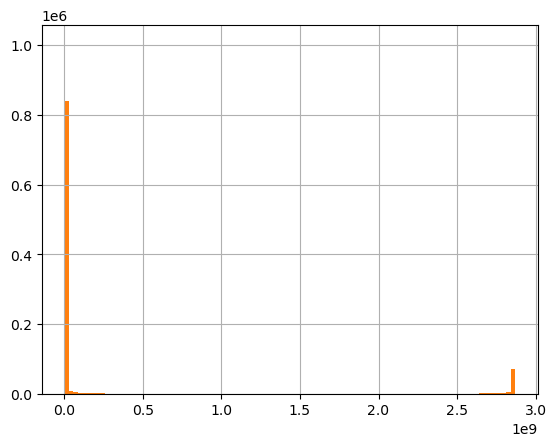

In [11]:
cnvnator_style_df['RD'].hist(bins=100)
cnvnator_style_df['GAUSSIAN-EVAL'].hist(bins=100)
cnvnator_style_df['T-TEST-EVAL'].describe()

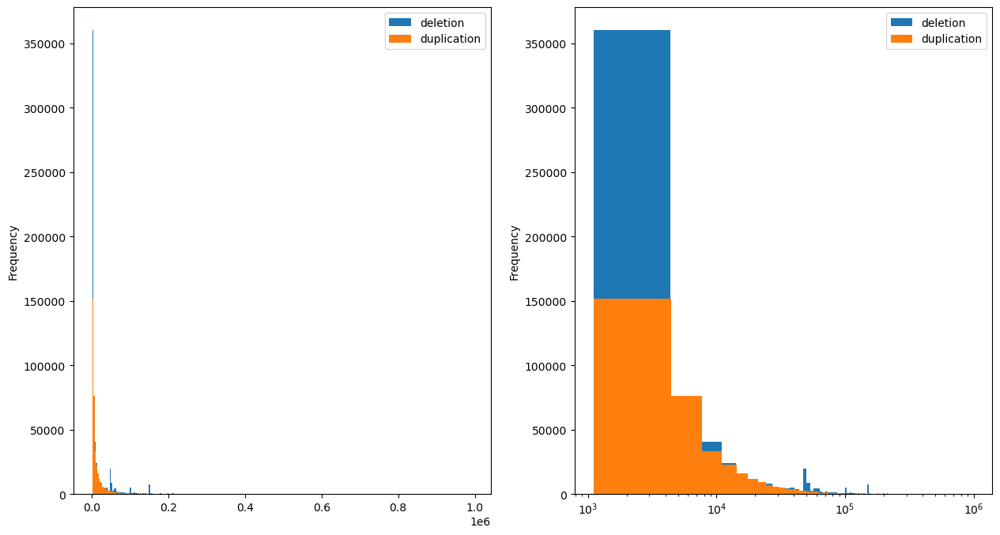

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= cnvnator_style_df.groupby(['Type'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=300, legend=True, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = cnvnator_style_df.groupby(['Type'])['LENGHT']

df_plot.plot(kind='hist',stacked=True, bins=300, legend=True, ax=axs[1]) # alpha for transparency

plt.show()

In [13]:
# SAMPLE TO COMPARE 
samples = cnvnator_style.loc[cnvnator_style['Sample_ID'] == "LP6005442-DNA_B01"]
samples.loc[samples['Chr']== '1'].head(20)

,Sample_ID,Chr,Start,End,CNV_value,Type,RD,LENGHT,T-TEST-EVAL,GAUSSIAN-EVAL
748649,LP6005442-DNA_B01,1,1,10000,1.0,deletion,0.000000,10000.0,1.593730e-11,0.000000e+00
748650,LP6005442-DNA_B01,1,11601,18800,3.0,duplication,2.584290,7200.0,0.000000e+00,2.151340e+09
748651,LP6005442-DNA_B01,1,33701,35000,3.0,duplication,1.776580,1300.0,9.453060e-03,7.643420e-22
748652,LP6005442-DNA_B01,1,45101,76800,3.0,duplication,1.531770,31700.0,0.000000e+00,2.749280e+09
748653,LP6005442-DNA_B01,1,122301,124000,3.0,duplication,1.622440,1700.0,2.902750e-02,2.552690e-04
748654,LP6005442-DNA_B01,1,137401,139700,3.0,duplication,1.829610,2300.0,1.344550e-06,3.399330e-13
748655,LP6005442-DNA_B01,1,177201,227700,1.0,deletion,0.005085,50500.0,3.155890e-12,5.091920e-194
748656,LP6005442-DNA_B01,1,230901,237000,3.0,duplication,1.622360,6100.0,1.065970e-08,5.870810e+03
748657,LP6005442-DNA_B01,1,248701,267400,3.0,duplication,1.300410,18700.0,0.000000e+00,5.179740e+08
748658,LP6005442-DNA_B01,1,267401,318300,1.0,deletion,0.009539,50900.0,3.131090e-12,1.261630e-195


In [14]:
samples = cnvnator_style_df.loc[cnvnator_style_df['Sample_ID'] == "LP6005442-DNA_B01"]
samples.loc[samples['Chr']== '4']

,Sample_ID,Chr,Start,End,CNV_value,Type,RD,LENGHT,T-TEST-EVAL,GAUSSIAN-EVAL
749741,LP6005442-DNA_B01,4,12201,68700,3.0,duplication,4.947870,56500.0,0.000000e+00,2.870960e+09
749743,LP6005442-DNA_B01,4,738501,741400,1.0,deletion,0.382726,2900.0,1.099120e-10,1.804740e-15
749750,LP6005442-DNA_B01,4,1423101,1478600,1.0,deletion,0.000094,55500.0,2.871580e-12,0.000000e+00
749753,LP6005442-DNA_B01,4,1602401,1603800,1.0,deletion,0.556440,1400.0,2.194770e-02,1.928200e-07
749763,LP6005442-DNA_B01,4,3572901,3576500,3.0,duplication,1.923240,3600.0,0.000000e+00,8.474580e-63
...,...,...,...,...,...,...,...,...,...,...
750027,LP6005442-DNA_B01,4,190963301,190986600,1.0,deletion,0.485498,23300.0,6.840020e-12,1.634630e+08
750028,LP6005442-DNA_B01,4,190988401,190995300,3.0,duplication,2.134370,6900.0,9.238990e-09,2.046950e+09
750029,LP6005442-DNA_B01,4,190995501,191005000,3.0,duplication,2.276370,9500.0,0.000000e+00,2.175630e+09
750030,LP6005442-DNA_B01,4,191005401,191040900,3.0,duplication,3.240310,35500.0,0.000000e+00,2.698390e+09


<h1> Adaptative introgression paper data 
    
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6860971/

In [15]:
#pd.set_option('display.max_rows', 400)


archaic_data = pd.read_csv('/home/jbazanwilliamson/borgstore/branchinecta/jbazanwilliamson/NIHMS1057227-CNVs.csv')
archaic_data = archaic_data.drop(columns=['name'])

header= ['Sample', 'Region', 'Country', 'Sample_ID', 'Sex']
archaic_anotation = pd.read_csv('/home/jbazanwilliamson/borgstore/branchinecta/jbazanwilliamson/archaic_anotation.csv', names=header, index_col=3)

papers_names_anotation = pd.read_csv('/home/jbazanwilliamson/borgstore/branchinecta/jbazanwilliamson/archaic_cnv_anotation.csv', index_col=0)

archaic_data['chr'] = archaic_data['chr'].str.replace('chr', '')
#archaic_data#['MEL_Papuan_HGDP00554_F']

a = archaic_anotation.merge(papers_names_anotation, left_index=True, right_index=True)
a = a.set_index("Biosample")
b= pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=0)
c = a.merge(b, left_index=True, right_index=True)
c = c.set_index("Sample")
c = c.loc[:,["Region", "Country", "3-Illumina_ID"]]


archaic_data.loc[archaic_data['chr'] == '8'].sort_values(by='start').head(100)

,chr,start,end,AFR_BantuSEHerero_HGDP01028_M,AFR_BantuSEHerero_HGDP01035_M,AFR_BantuKenya_HGDP01414_F,AFR_BantuKenya_HGDP01417_M,AFR_BantuSETswana_HGDP01030_M,AFR_BantuSETswana_HGDP01034_M,AFR_Biaka_HGDP00457_M,...,Pongo_abelii.SB550_Sibu,Pongo_pygmaeus.A939_Nonja,Pongo_pygmaeus.A942_Gusti,Pongo_pygmaeus.A943_Tilda,Pongo_pygmaeus.A944_Napoleon,Pongo_pygmaeus.KB4204_Dinah,Pongo_pygmaeus.KB5404_Billy,Pongo_pygmaeus.KB5405_Louis,Pongo_pygmaeus.KB5406_Doris,Pongo_pygmaeus.KB5543_Baldy
2276,8,15239,181782,18.102140,16.657228,18.790268,14.605123,19.865812,17.350503,15.964516,...,1.759150,1.659496,1.881809,1.736219,1.690038,1.770852,1.730418,1.731522,1.640721,1.596575
2282,8,308302,312885,1.942812,1.966856,2.860288,1.869752,1.935090,1.871739,1.520032,...,1.388059,1.194884,1.306700,1.061324,1.188090,1.033056,1.298266,1.112411,1.218629,1.387564
2287,8,563365,564848,2.063727,1.884002,1.935278,2.161965,1.981887,2.037546,1.793126,...,1.617615,1.601220,1.611806,1.581216,1.486071,1.045986,1.462911,1.290275,1.494902,1.461551
2295,8,593901,599598,0.000000,1.959514,0.981839,1.925512,0.921012,1.029626,1.804061,...,1.501709,1.444413,1.410690,1.551852,1.314862,1.320752,1.426105,1.411853,1.318042,1.368436
2298,8,604629,608409,1.679397,1.789183,1.797957,1.979019,1.836960,1.816187,1.760114,...,1.712071,2.342550,2.302220,2.406231,2.366626,2.126806,2.102135,2.248408,2.188046,1.992249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2345,8,28928271,28931320,1.907822,2.140504,1.861160,2.001985,1.927560,1.913256,2.006786,...,2.194124,1.080462,1.196105,1.344679,1.358242,1.731431,2.215170,1.949399,2.251646,2.219039
2350,8,29146717,29151078,1.806873,2.267498,1.729068,2.041050,1.885789,1.847567,1.657365,...,2.164093,1.868077,2.069690,1.771854,1.948879,2.353204,1.925927,1.702107,2.255029,1.755821
2354,8,29327222,29335348,1.847362,1.978007,1.832998,1.979434,1.954320,1.953891,1.921237,...,0.000000,0.003826,0.026113,0.000000,0.000000,0.000000,0.011196,0.022584,0.000000,0.000000
2356,8,29431451,29440922,1.872207,1.950466,1.863697,1.893305,1.911063,1.937462,2.069336,...,2.018510,2.159898,2.330527,2.346401,2.457444,1.807069,2.143563,2.074328,1.684352,1.897945


In [16]:
archaic_data['EA_Uygur_HGDP01306_F'].sort_values()

209       0.000000
3464      0.000000
3467      0.000000
1371      0.000000
1753      0.000000
           ...    
1201    324.237694
1315    341.165017
4670    378.757250
1403    414.753138
13      597.402409
Name: EA_Uygur_HGDP01306_F, Length: 5135, dtype: float64

In [17]:
counts = archaic_data.iloc[:,3:254]
counts = counts.T 
counts = c.merge(counts, left_index=True, right_index=True)
counts = counts.set_index("3-Illumina_ID")
counts = counts.drop(columns=['Region', 'Country'])

counts_a = counts.T
counts_a#.head(20)


3-Illumina_ID,LP6005519-DNA_C05,LP6005442-DNA_B01,LP6005443-DNA_B10,LP6005441-DNA_F09,LP6005442-DNA_G01,LP6005441-DNA_D07,LP6005441-DNA_A04,LP6005441-DNA_B09,LP6005441-DNA_C02,LP6005443-DNA_G05,...,LP6005519-DNA_B06,LP6005677-DNA_F01,LP6005441-DNA_H09,LP6005441-DNA_B11,LP6005441-DNA_D02,LP6005441-DNA_H07,LP6005441-DNA_D06,LP6005443-DNA_H01,LP6005441-DNA_A06,LP6005592-DNA_B01
0,2.401028,1.998262,1.993820,1.954707,1.954912,1.744118,1.974834,1.715089,1.779060,1.956430,...,1.985123,1.808764,1.852649,1.820300,1.768439,1.837633,1.829354,1.853747,1.975165,1.787930
1,2.016179,2.002721,1.957054,2.004279,1.921470,1.917796,2.127451,1.986345,1.880115,2.035816,...,1.860985,1.935829,1.841631,1.828189,1.951551,1.964953,2.027913,2.044010,2.049980,2.031175
2,2.139658,1.747312,1.877853,1.727462,1.933126,2.134733,1.815096,1.596115,1.964962,1.868807,...,1.860781,1.816506,1.817291,2.038003,2.068898,1.775470,1.944979,2.065557,1.830250,1.841507
3,2.346854,1.804865,1.996412,1.948360,1.825581,1.814401,1.905848,1.755909,1.891586,1.896648,...,1.889087,1.592520,1.762702,1.806363,1.819496,1.025321,2.155907,1.949125,1.678309,1.772575
4,28.275513,22.632874,25.191260,25.471460,25.607324,26.130299,24.478180,28.592310,24.402062,26.074265,...,25.270744,26.448447,21.417776,26.617903,24.307306,27.642580,28.186419,27.282453,25.899915,19.172355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5130,2.192174,2.104640,1.983139,1.790199,1.739021,2.016616,2.079623,1.941146,1.973098,1.866453,...,2.020915,2.075747,2.271578,2.127720,1.929148,1.953169,1.945864,2.001003,1.931213,1.803273
5131,2.268124,1.905573,1.591660,1.932060,2.057700,2.037391,1.956664,1.880225,2.206873,1.915286,...,1.662585,1.859050,1.835675,2.179070,1.904821,2.000083,1.873114,1.847847,1.921276,1.763232
5132,2.383905,2.145915,2.180080,1.865969,2.096408,2.019804,2.063512,2.083116,1.989356,1.828308,...,1.877926,1.976315,2.017628,1.910060,1.940184,1.798868,1.840821,1.947781,2.076042,1.991117
5133,2.362471,1.908293,1.989270,1.937375,1.909353,1.810818,1.891251,1.829849,1.912284,1.918486,...,2.011201,1.949800,2.013586,1.913698,1.801449,1.979710,1.970200,1.944290,1.829112,2.022726


In [18]:
counts_a['LP6005442-DNA_B01'].sort_values()

209       0.000000
3464      0.000000
3467      0.000000
1371      0.000000
1753      0.000000
           ...    
1201    324.237694
1315    341.165017
4670    378.757250
1403    414.753138
13      597.402409
Name: LP6005442-DNA_B01, Length: 5135, dtype: float64

In [19]:
counts = archaic_data
counts = counts.T 
counts = c.merge(counts, left_index=True, right_index=True)
counts = counts.set_index("3-Illumina_ID")
counts = counts.drop(columns=['Region', 'Country'])

counts = counts.T

counts.insert(0, 'chr', archaic_data['chr'])
counts.insert(1, 'start', archaic_data['start'])
counts.insert(2, 'end', archaic_data['end'])

same_name_archaic =  counts
same_name_archaic

3-Illumina_ID,chr,start,end,LP6005519-DNA_C05,LP6005442-DNA_B01,LP6005443-DNA_B10,LP6005441-DNA_F09,LP6005442-DNA_G01,LP6005441-DNA_D07,LP6005441-DNA_A04,...,LP6005519-DNA_B06,LP6005677-DNA_F01,LP6005441-DNA_H09,LP6005441-DNA_B11,LP6005441-DNA_D02,LP6005441-DNA_H07,LP6005441-DNA_D06,LP6005443-DNA_H01,LP6005441-DNA_A06,LP6005592-DNA_B01
0,1,21910306,21913877,2.401028,1.998262,1.99382,1.954707,1.954912,1.744118,1.974834,...,1.985123,1.808764,1.852649,1.8203,1.768439,1.837633,1.829354,1.853747,1.975165,1.78793
1,1,101212616,101214920,2.016179,2.002721,1.957054,2.004279,1.92147,1.917796,2.127451,...,1.860985,1.935829,1.841631,1.828189,1.951551,1.964953,2.027913,2.04401,2.04998,2.031175
2,1,147384646,147386567,2.139658,1.747312,1.877853,1.727462,1.933126,2.134733,1.815096,...,1.860781,1.816506,1.817291,2.038003,2.068898,1.77547,1.944979,2.065557,1.83025,1.841507
3,1,195013533,195020996,2.346854,1.804865,1.996412,1.94836,1.825581,1.814401,1.905848,...,1.889087,1.59252,1.762702,1.806363,1.819496,1.025321,2.155907,1.949125,1.678309,1.772575
4,1,228416,267160,28.275513,22.632874,25.19126,25.47146,25.607324,26.130299,24.47818,...,25.270744,26.448447,21.417776,26.617903,24.307306,27.64258,28.186419,27.282453,25.899915,19.172355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5130,22,31678952,31682546,2.192174,2.10464,1.983139,1.790199,1.739021,2.016616,2.079623,...,2.020915,2.075747,2.271578,2.12772,1.929148,1.953169,1.945864,2.001003,1.931213,1.803273
5131,22,32112132,32113222,2.268124,1.905573,1.59166,1.93206,2.0577,2.037391,1.956664,...,1.662585,1.85905,1.835675,2.17907,1.904821,2.000083,1.873114,1.847847,1.921276,1.763232
5132,22,50252755,50261847,2.383905,2.145915,2.18008,1.865969,2.096408,2.019804,2.063512,...,1.877926,1.976315,2.017628,1.91006,1.940184,1.798868,1.840821,1.947781,2.076042,1.991117
5133,22,33050377,33056621,2.362471,1.908293,1.98927,1.937375,1.909353,1.810818,1.891251,...,2.011201,1.9498,2.013586,1.913698,1.801449,1.97971,1.9702,1.94429,1.829112,2.022726


In [20]:
count = counts_a.T
#features = archaic_anotation.merge(count, left_index=True, right_index=True)
#features = features.loc[:,["Region", "Country"]]
#features

#imputation and normalization 
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
X = imp.fit_transform(counts_a.T)

x = StandardScaler().fit_transform(X)


#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=count.index)




df_pca = anotation.merge(df_pca, left_index=True, right_index=True)
df_pca

,2-ena_id,4-reich_id,5-ena_ftp_bam_ptr,6-Sequencing_Panel,7-Gender,8-Population_ID,9-Contributor,10-Region,11-Country,12-Town,...,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
3-Illumina_ID,,,,,,,,,,,,,,,,,,,,,
LP6005443-DNA_B06,SAMEA3302859,S_Icelandic-2,ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324295/LP6005...,C,F,Icelandic,Coriell,WestEurasia,Iceland,Cell_line_repository_sampling_location_unknown,...,-2.064271,1.268795,7.582689,-5.185661,-7.448910,1.596996,-3.991524,-5.916044,-3.105312,-2.299029
LP6005442-DNA_D08,SAMEA3302837,S_Icelandic-1,ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125657/srt.al...,C,F,Icelandic,Coriell,WestEurasia,Iceland,Cell_line_repository_sampling_location_unknown,...,-6.634009,2.742635,4.229134,-4.669270,-8.645018,2.053623,-4.115326,-6.215494,-2.527867,2.870697
LP6005441-DNA_D07,SAMEA3302616,S_Makrani-2,ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324870/LP6005...,C,F,Makrani,Howard Cann,SouthAsia,Pakistan,?,...,-14.023536,6.777031,12.866999,-4.698315,-5.954702,1.007891,-1.188057,0.350103,-3.636761,5.439264
LP6005441-DNA_C07,SAMEA3302771,S_Makrani-1,ftp.sra.ebi.ac.uk/vol1/ERZ312/ERZ312785/LP6005...,C,M,Makrani,Howard Cann,SouthAsia,Pakistan,?,...,-8.518061,5.182573,12.797772,-10.492568,-8.228725,0.718227,2.214581,-2.866949,-0.149374,-4.649778
LP6005442-DNA_F12,SAMEA3302764,S_Tubalar-1,ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324267/LP6005...,C,F,Tubalar,Rem Sukernik / Stanislav Dryomov,CentralAsiaSiberia,Russia,"Artybash and Kebezen, Altai-Sayan Upland",...,-4.072285,-3.532626,-15.023070,3.220501,-0.393467,0.248972,-1.929384,-1.650596,1.742642,-6.631057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H06,SAMEA3302662,S_Karitiana-2,ftp.sra.ebi.ac.uk/vol1/ERZ312/ERZ312827/LP6005...,C,F,Karitiana,Howard Cann,America,Brazil,?,...,-10.391385,4.163947,8.757121,12.067928,2.791009,0.080235,-0.212944,14.915829,-4.640233,-6.856637
LP6005441-DNA_H10,SAMEA3302766,S_Russian-2,ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125631/srt.al...,C,F,Russian,Howard Cann,WestEurasia,Russia,Vologda Administrative Region,...,-13.943043,8.615522,16.901379,-2.207775,-9.165473,2.792140,-5.763332,-0.227898,-3.282309,1.329891
LP6005519-DNA_A06,SAMEA3302692,S_Burmese-2,ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324351/LP6005...,C,M,Burmese,Toomas Kivisild / Joseph Wee Tien Seng,EastAsia,Myanmar,Yangon (sampled in Singapore),...,-0.836253,-8.722601,-14.597676,1.457661,-0.914489,-4.662093,5.040003,-7.453176,6.831606,-7.469342


                        2-ena_id     4-reich_id  \
10-Region                                         
WestEurasia         SAMEA3302859  S_Icelandic-2   
WestEurasia         SAMEA3302837  S_Icelandic-1   
SouthAsia           SAMEA3302616    S_Makrani-2   
SouthAsia           SAMEA3302771    S_Makrani-1   
CentralAsiaSiberia  SAMEA3302764    S_Tubalar-1   
...                          ...            ...   
America             SAMEA3302662  S_Karitiana-2   
WestEurasia         SAMEA3302766    S_Russian-2   
EastAsia            SAMEA3302692    S_Burmese-2   
EastAsia            SAMEA3302895    S_Burmese-1   
Africa              SAMEA3302716      S_Mbuti-2   

                                                    5-ena_ftp_bam_ptr  \
10-Region                                                               
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324295/LP6005...   
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125657/srt.al...   
SouthAsia           ftp.sra.ebi.ac.uk/vol1/E

                        2-ena_id     4-reich_id  \
10-Region                                         
WestEurasia         SAMEA3302859  S_Icelandic-2   
WestEurasia         SAMEA3302837  S_Icelandic-1   
SouthAsia           SAMEA3302616    S_Makrani-2   
SouthAsia           SAMEA3302771    S_Makrani-1   
CentralAsiaSiberia  SAMEA3302764    S_Tubalar-1   
...                          ...            ...   
America             SAMEA3302662  S_Karitiana-2   
WestEurasia         SAMEA3302766    S_Russian-2   
EastAsia            SAMEA3302692    S_Burmese-2   
EastAsia            SAMEA3302895    S_Burmese-1   
Africa              SAMEA3302716      S_Mbuti-2   

                                                    5-ena_ftp_bam_ptr  \
10-Region                                                               
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324295/LP6005...   
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125657/srt.al...   
SouthAsia           ftp.sra.ebi.ac.uk/vol1/E

                        2-ena_id     4-reich_id  \
10-Region                                         
WestEurasia         SAMEA3302859  S_Icelandic-2   
WestEurasia         SAMEA3302837  S_Icelandic-1   
SouthAsia           SAMEA3302616    S_Makrani-2   
SouthAsia           SAMEA3302771    S_Makrani-1   
CentralAsiaSiberia  SAMEA3302764    S_Tubalar-1   
...                          ...            ...   
America             SAMEA3302662  S_Karitiana-2   
WestEurasia         SAMEA3302766    S_Russian-2   
EastAsia            SAMEA3302692    S_Burmese-2   
EastAsia            SAMEA3302895    S_Burmese-1   
Africa              SAMEA3302716      S_Mbuti-2   

                                                    5-ena_ftp_bam_ptr  \
10-Region                                                               
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324295/LP6005...   
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125657/srt.al...   
SouthAsia           ftp.sra.ebi.ac.uk/vol1/E

/home/jbazanwilliamson/analysis/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = matplotlib.pyplot.figure(


                        2-ena_id     4-reich_id  \
10-Region                                         
WestEurasia         SAMEA3302859  S_Icelandic-2   
WestEurasia         SAMEA3302837  S_Icelandic-1   
SouthAsia           SAMEA3302616    S_Makrani-2   
SouthAsia           SAMEA3302771    S_Makrani-1   
CentralAsiaSiberia  SAMEA3302764    S_Tubalar-1   
...                          ...            ...   
America             SAMEA3302662  S_Karitiana-2   
WestEurasia         SAMEA3302766    S_Russian-2   
EastAsia            SAMEA3302692    S_Burmese-2   
EastAsia            SAMEA3302895    S_Burmese-1   
Africa              SAMEA3302716      S_Mbuti-2   

                                                    5-ena_ftp_bam_ptr  \
10-Region                                                               
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324295/LP6005...   
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125657/srt.al...   
SouthAsia           ftp.sra.ebi.ac.uk/vol1/E

                        2-ena_id     4-reich_id  \
10-Region                                         
WestEurasia         SAMEA3302859  S_Icelandic-2   
WestEurasia         SAMEA3302837  S_Icelandic-1   
SouthAsia           SAMEA3302616    S_Makrani-2   
SouthAsia           SAMEA3302771    S_Makrani-1   
CentralAsiaSiberia  SAMEA3302764    S_Tubalar-1   
...                          ...            ...   
America             SAMEA3302662  S_Karitiana-2   
WestEurasia         SAMEA3302766    S_Russian-2   
EastAsia            SAMEA3302692    S_Burmese-2   
EastAsia            SAMEA3302895    S_Burmese-1   
Africa              SAMEA3302716      S_Mbuti-2   

                                                    5-ena_ftp_bam_ptr  \
10-Region                                                               
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ324/ERZ324295/LP6005...   
WestEurasia         ftp.sra.ebi.ac.uk/vol1/ERZ125/ERZ125657/srt.al...   
SouthAsia           ftp.sra.ebi.ac.uk/vol1/E

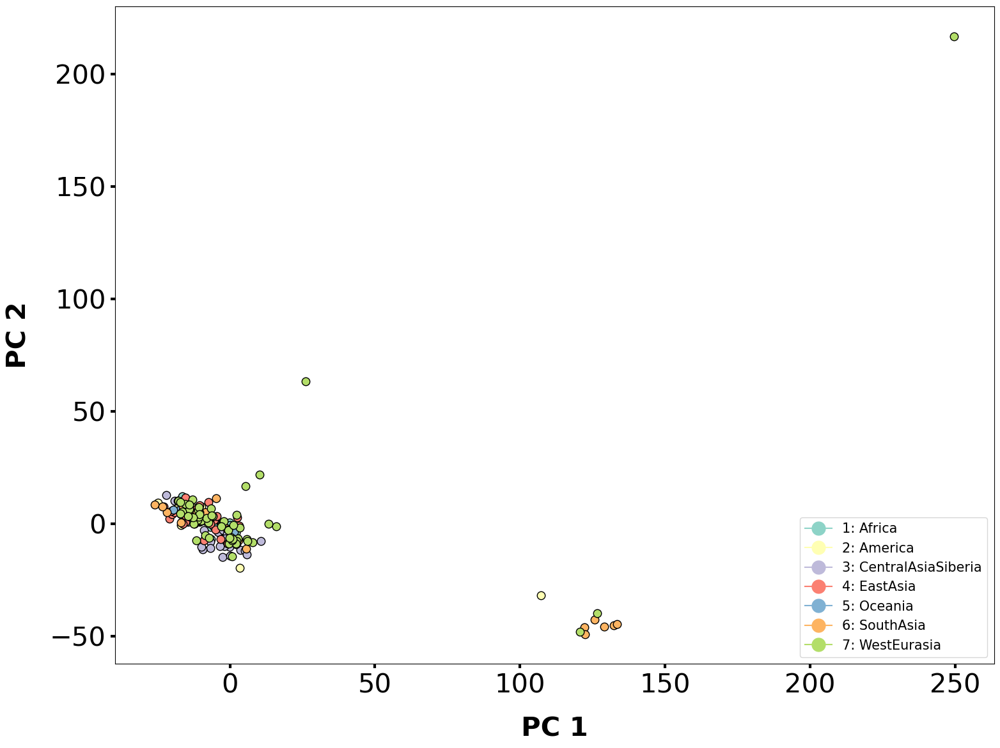

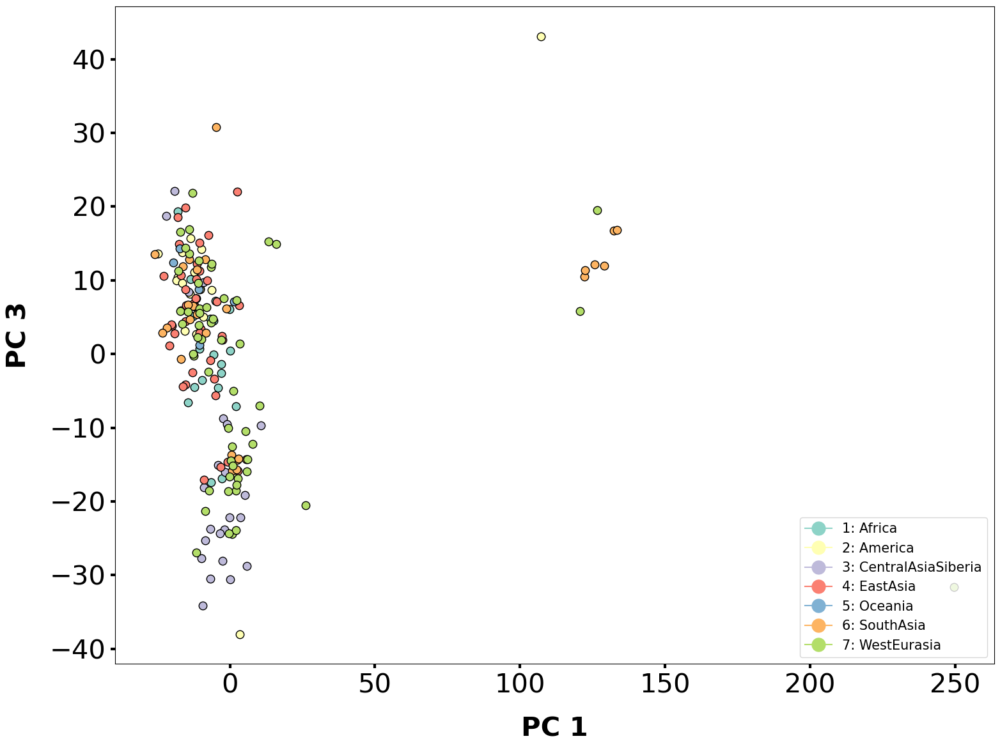

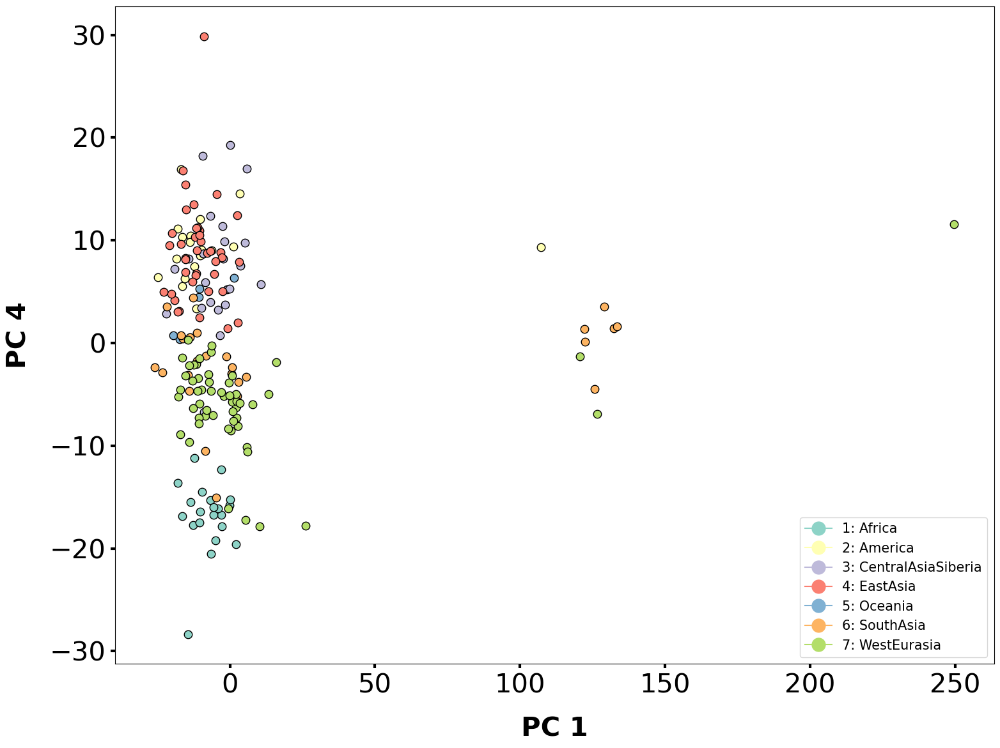

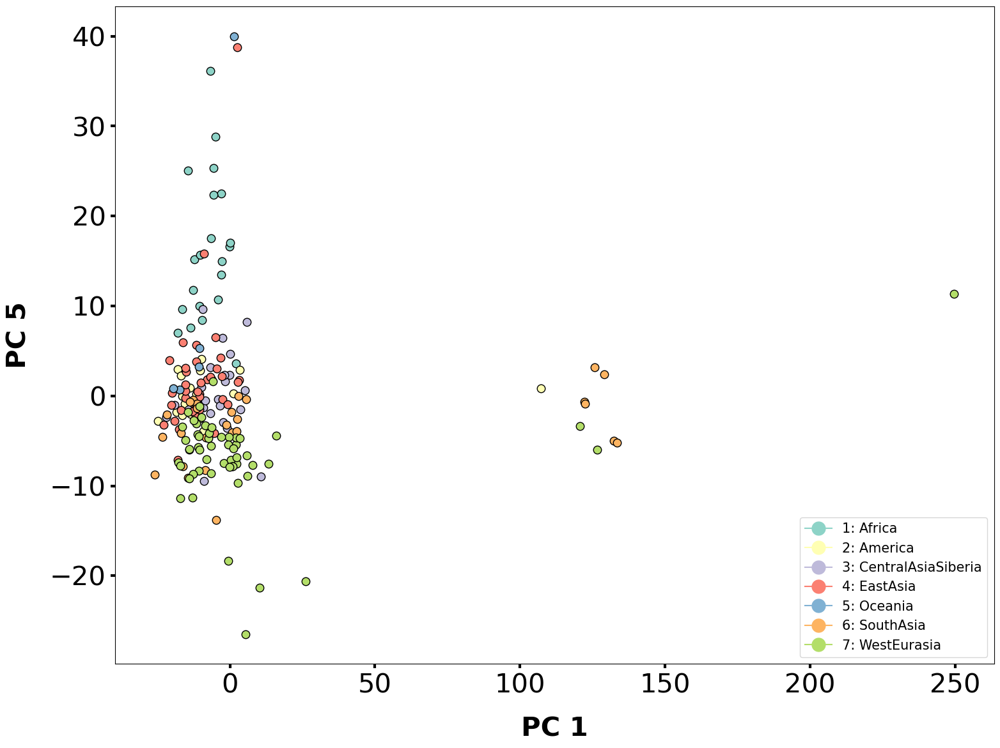

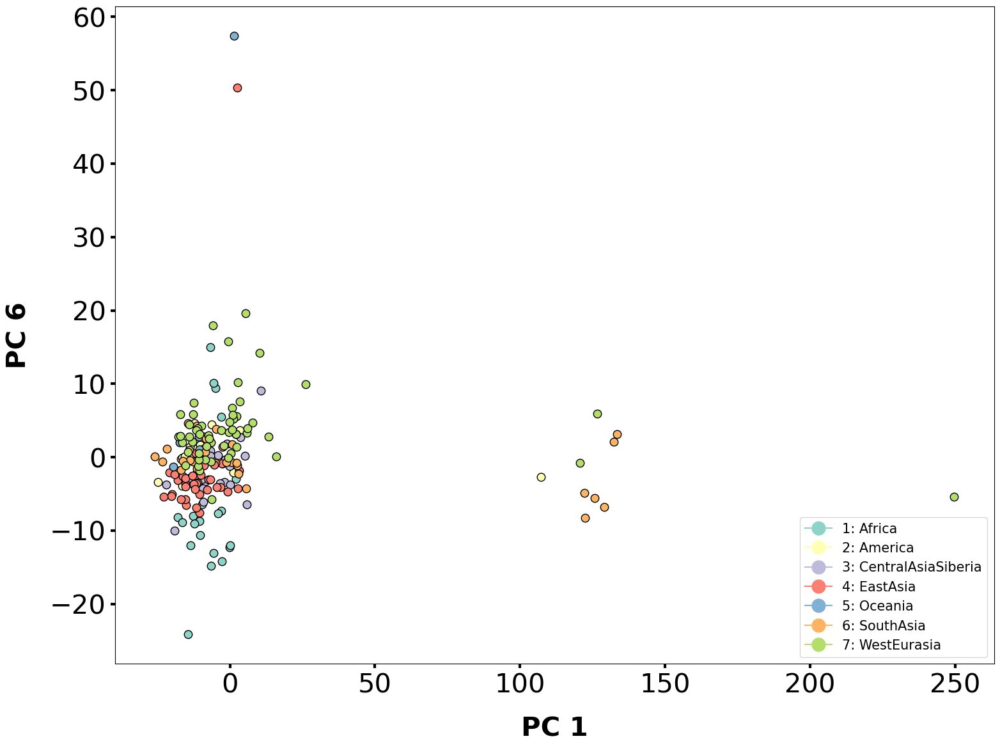

...

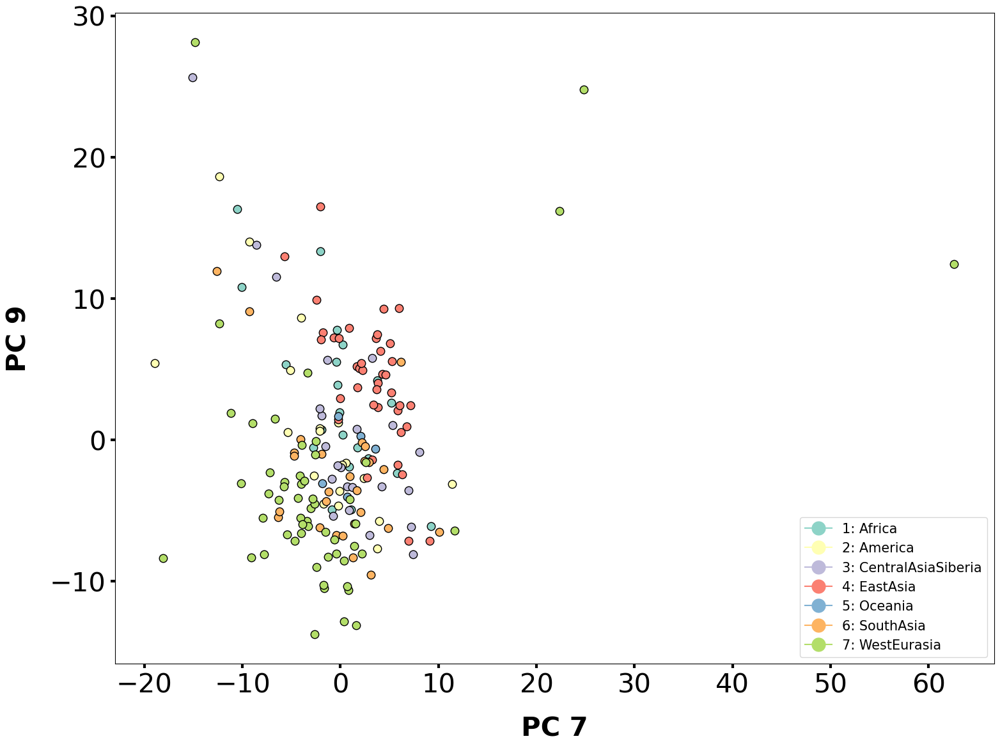

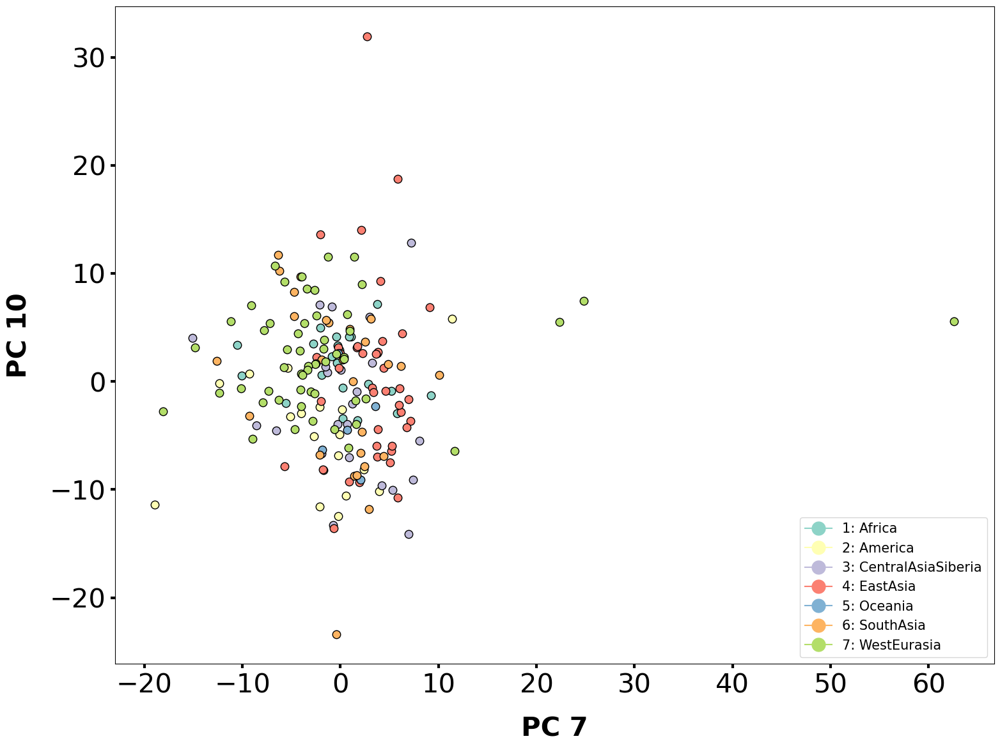

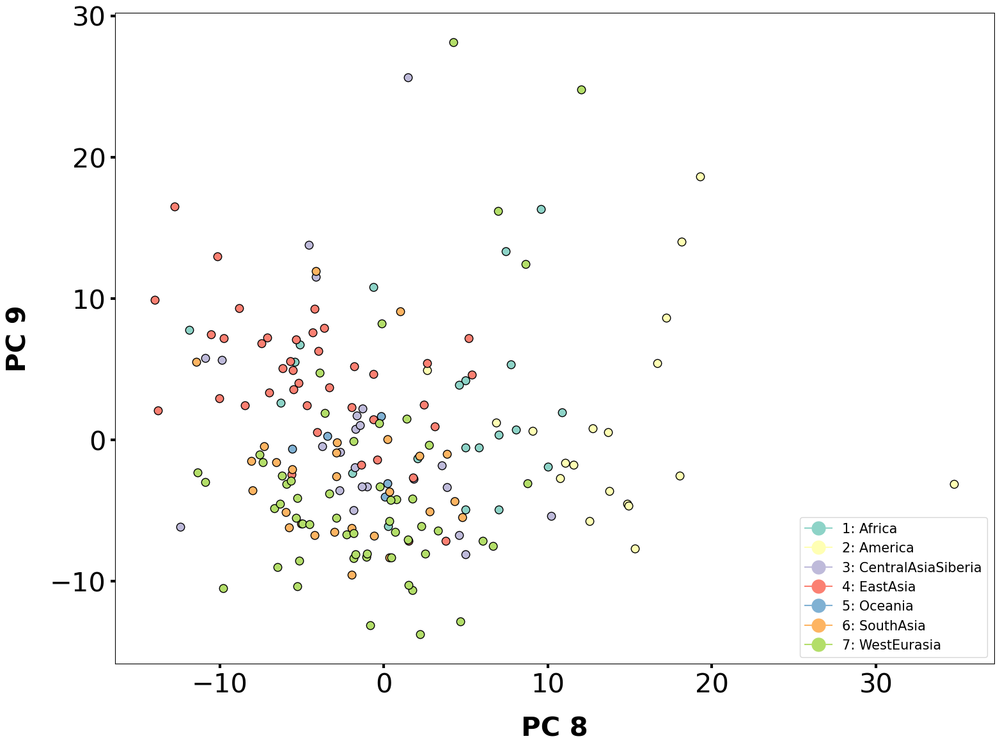

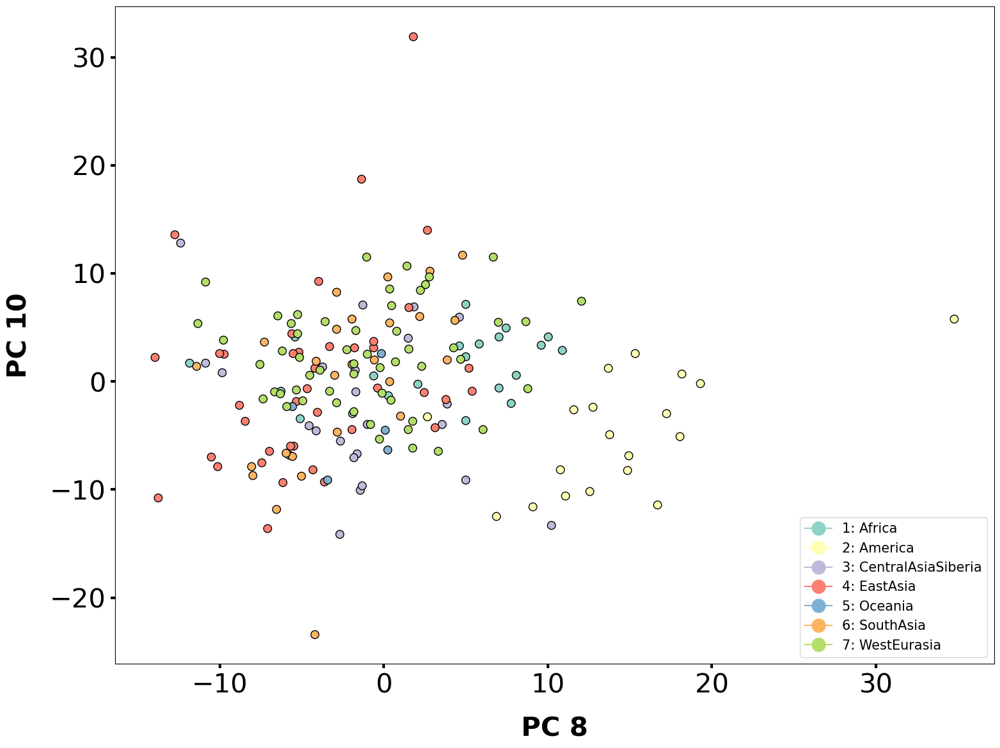

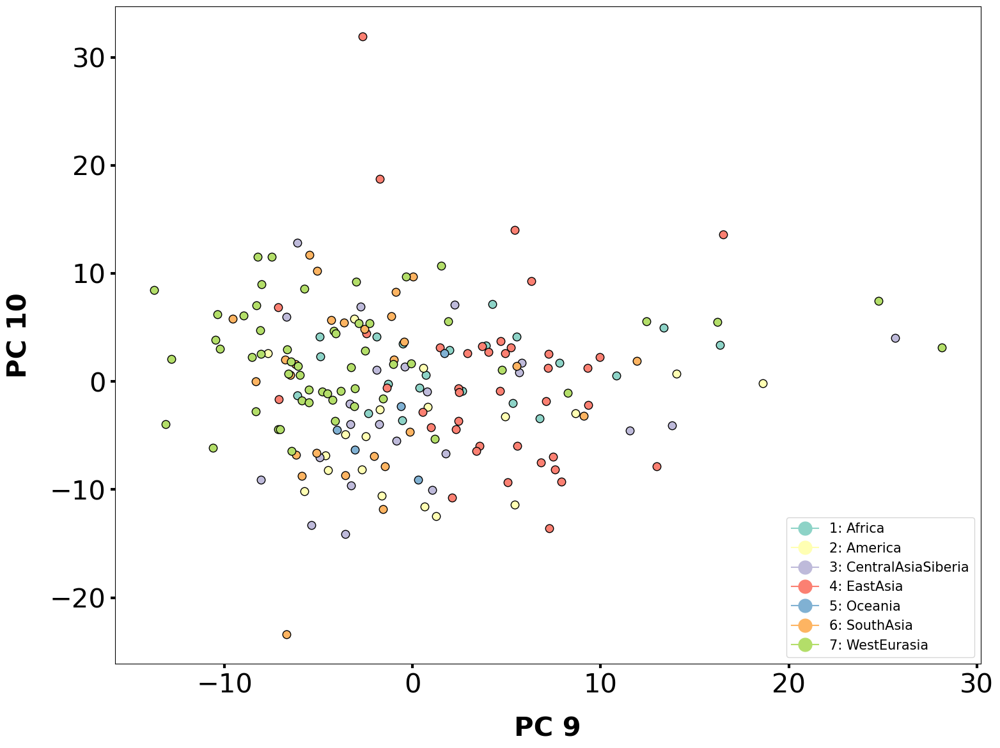

In [21]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)


In [22]:
pca.explained_variance_ratio_

array([0.23088838, 0.07848437, 0.03907977, 0.01819508, 0.01630781,
       0.01227405, 0.01054714, 0.01034508, 0.00985068, 0.00871344])

<h2> Filtering my CNVs only in archaic papers CNVs

In [ ]:
overlapped = []

cnvnator_df_np = cnvnator_style_df.to_numpy()
archaic_data_np = same_name_archaic.to_numpy()

for cnv_q in cnvnator_df_np:
    for cnv_c in archaic_data_np:
    
        if cnv_q[1] == cnv_c[0]: #Chromosome
            # QDNASEQ CNVS in SUDMANT DATA(SUDMANT bigger than  QDNASEQ)
            if (cnv_c[1] <= cnv_q[2] <= cnv_c[2]) or (cnv_c[1] <= cnv_q[3] <= cnv_c[2]):
                #leng_dqna = (cnv_q[3]-cnv_q[2])
                #leng_cnvnator = (cnv_c[2]-cnv_c[1])
                #if (leng_dqna/leng_cnvnator)>0.6:
                overlapped.append([cnv_q[0], cnv_c[0], cnv_q[2], cnv_q[3], cnv_c[1], cnv_c[2], cnv_q[4], cnv_q[5], cnv_q[6], cnv_q[7], cnv_q[8], cnv_q[9]])
                    #overlapped.append(cnv_q)
            # SUDMANT DATA CNVS in QDNASEQ CNVs(QDNASEQ bigger than SUDMANT DATA)
            
            if (cnv_q[2] <= cnv_c[1] <= cnv_q[3]) or (cnv_q[2] <= cnv_c[2] <= cnv_q[3]):
                #leng_dq/na = (cnv_q[3]-cnv_q[2])
                #leng_cnvnator = (cnv_c[2]-cnv_c[1])
                #if (leng_cnvnator/leng_dqna)>0.6:
                overlapped.append([cnv_q[0], cnv_c[0], cnv_q[2], cnv_q[3], cnv_c[1], cnv_c[2], cnv_q[4], cnv_q[5], cnv_q[6], cnv_q[7], cnv_q[8], cnv_q[9]])
                    #overlapped.append([cnv_q, cnv_c])
                    #overlapped.append(cnv_q)

In [ ]:
#RUN THIS
qdnaseq_df = pd.DataFrame(overlapped)
qdnaseq_df.columns =['Sample_ID', 'Chr', 'Start_original', 'End_original', 'Start','End','SIZE','SCORE', 'RD', 'LENGHT', 'P-VALUE', 'GAUSSIAN']
qdnaseq_df = qdnaseq_df.drop_duplicates()

######################################################################
#### SAVING DATAFRAME TO DO VST ANALYSIS #############################
#qdnaseq_df.to_csv("cnvator_data_archaic_overlapped.csv",  index= False)

qdnaseq_df

In [ ]:
qdnaseq_df['P-VALUE'].describe()

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
plt.xlabel('Size')

df = qdnaseq_df.groupby(['SCORE'])['LENGHT']

df.plot(kind='hist',stacked=True, bins=100,legend=True, ax=axs[0]) # alpha for transparency
#plt.xlabel('Size')
plt.xscale('log')

df = qdnaseq_df.groupby(['SCORE'])['LENGHT']

df.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency
#plt.xlabel('Size')
plt.show()

In [ ]:
samples = qdnaseq_df.loc[qdnaseq_df['Sample_ID'] == "LP6005442-DNA_B01"]

samples.loc[samples['Chr']== '1']

In [ ]:
#qdnaseq_df = qdnaseq_df_no_sex_chr
deletions = qdnaseq_df[qdnaseq_df['SCORE'] == 'deletion'] 
duplications= qdnaseq_df[qdnaseq_df['SCORE'] == 'duplication'] 


In [ ]:
deletions

In [ ]:
#change to df when using telomeres and centromeres filtration
final_cnv = deletions.pivot_table(index=["Chr", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()


final_cnv
#Sample_ID	Chr	Start	End	CNV_value	Type	RD	LENGHT	T-TEST-EVAL	GAUSSIAN-EVAL


In [ ]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,3:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

In [ ]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 


In [ ]:
#import seaborn as sns

#pd.set_option("display.max_rows", None, "display.max_columns", None)
biallelic_deletions = deletions[deletions['RD'] < 2 ] 
biallelic_deletions = biallelic_deletions.groupby('Sample_ID').size()

biallelic_deletions = pd.DataFrame(biallelic_deletions)
#biallelic_deletions = biallelic_deletions.set_index('SAMPLE')

biallelic_deletions = features.merge(biallelic_deletions, left_index=True, right_index=True)
#biallelic_deletions = biallelic_deletions.reset_index()

#heterozygous_deletions.value_counts('SAMPLE').sort_index()
biallelic_deletions.columns = ['7-Gender', '10-Region', '11-Country', 'TYPE']
biallelic_deletions


#pd.set_option("display.max_rows", None, "display.max_columns", None)
heterozygous_deletions = deletions[deletions['RD'] > 1] 
heterozygous_deletions = heterozygous_deletions.groupby('Sample_ID').size()
heterozygous_deletions = pd.DataFrame(heterozygous_deletions)
heterozygous_deletions = features.merge(heterozygous_deletions, left_index=True, right_index=True)
heterozygous_deletions.columns = ['7-Gender', '10-Region', '11-Country', 'TYPE']
heterozygous_deletions
heterozygous_deletions


fig, axs = plt.subplots(1, 2, figsize=(15, 14))

ax = seaborn.violinplot(x="TYPE", y="10-Region", data=biallelic_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[0], cut=0)

ax.set_xlabel("biallelic CNVs per individual")
ax.set_ylabel("Region")

ax = seaborn.violinplot(x="TYPE", y="10-Region", data=heterozygous_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[1], cut=0)

ax.set_xlabel("hetozygous CNVs per individual")
ax.set_ylabel("Region")
plt.show()

In [ ]:
freq = final_cnv.iloc[:,3:283]
freq_input = freq.rename(columns=anotation['8-Population_ID'])
df = freq_input.T

df = df.notnull().groupby(level=0).mean()

seaborn.set(font_scale=2)
corrmatrix = df.T.corr(method='pearson')
seaborn.clustermap(corrmatrix, figsize=(40,40))#, row_colors=row_colors, row_cluster=True, figsize=(40,40))

plt.savefig('../plots/clustermap_populations_archaic_overlap.pdf')


In [ ]:
freq = final_cnv.iloc[:,3:283]
freq_input = freq.rename(columns=anotation['10-Region'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

lut = dict(zip(df.columns.unique(), "rbgymck"))
lut

seaborn.set(font_scale=5)
corrmatrix = df.corr(method='pearson')
row_colors = df.columns.map(lut)
seaborn.clustermap(corrmatrix, row_colors=row_colors, row_cluster=True, figsize=(40,40))
plt.savefig('../plots/clustermap_regions_archaic_overlap_deletions.pdf')


In [ ]:
#imp = SimpleImputer(missing_values=np.nan, strategy='mean')
#x = imp.fit_transform(counts.T)

#track features for pca & tsne
#X = StandardScaler().fit_transform(x)


#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

In [ ]:
pca.explained_variance_ratio_

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (4.46%)', label_vertical='PC2 (3.87%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("PCA deletions (archaic-shared samples)")

plt.savefig('../plots/pca_deletions.png', transparent=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (4.46%)', label_vertical='PC2 (3.87%)', factor='11-Country', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("PCA deletions (archaic-shared samples (countries))")
#plt.savefig('pca_deletions_countries.pdf')

In [ ]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

In [ ]:
## DUPLICATIONS

In [ ]:
final_cnv = duplications.pivot_table(index=["Chr", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()


final_duplications = final_cnv.iloc[:,4:284]
counts_duplications = final_duplications
counts_duplications = counts_duplications.fillna(2)


#counts = counts[counts.columns.intersection(counts_a.columns)]
#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])


counts_duplications = counts_duplications.T
counts_duplications = counts_duplications.sort_index()


features_duplications = anotation.merge(counts_duplications, left_index=True, right_index=True)
features_duplications = features_duplications.loc[:,["7-Gender","10-Region", "11-Country",]]
features_duplications = features_duplications.sort_index()
features_duplications


In [ ]:
#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts_duplications)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features_duplications.index)




df_pca = features_duplications.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

In [ ]:
d = plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (27.13%)', label_vertical='PC2 (11.39%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("PCA duplications (archaic genes)")
plt.savefig('pca_duplications.png')

In [ ]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

<h1> Phylo analysis

In [ ]:
from Bio.Phylo.TreeConstruction import _Matrix
from Bio.Phylo.TreeConstruction import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
import scipy.stats

a = scipy.stats.zscore(counts, axis=1)
distances = pdist(np.array(a), metric='euclidean')
dist_matrix = squareform(distances)
dist_matrix.shape

dist_matrix

name =  list(counts.index)
matrix = dist_matrix
dist_matrix

In [ ]:
counts.index

In [ ]:
lut = dict(zip(features['10-Region'].unique(), "rbgymck"))

row_colors = features['10-Region'].map(lut)
row_color = row_colors.to_dict()
lut

features

In [ ]:
from biotite.sequence.phylo import neighbor_joining
#track features for pca & tsne
#features = features.sort_index()

#names.get_indices()
labels = list(counts.index)
#labels = list(features['10-Region'])
tree = biotite.sequence.phylo.neighbor_joining(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=True))


#with open('newick_tree.tree', 'a') as f:
#    f.write(t)

In [ ]:
from Bio import Phylo
from io import StringIO 
import pylab
from matplotlib.lines import Line2D

handle = StringIO(str(tree.to_newick(labels=labels, include_distance=True)))
tree_2 = Phylo.read(handle, "newick")
tree_2.ladderize()

matplotlib.rc('font', size=6)
    # set the size of the figure
fig = plt.figure(figsize=(10, 70), dpi=300)
    # alternatively
    # fig.set_size_inches(10, 40)
axes = fig.add_subplot(3, 1, 1)
fig.tight_layout()
Phylo.draw(tree_2, 
           axes=axes, 
           do_show=False,
           label_colors= row_color)
pylab.axis('off')

### CUSTOM LEGEND
custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4),
                Line2D([0], [0], color='m', lw=4),
                Line2D([0], [0], color='c', lw=4),
                Line2D([0], [0], color='k', lw=4)]

#fig, ax = plt.subplots()
plt.legend(custom_lines, ['WestEurasia', 'SouthAsia', 'CentralAsiaSiberia', 'America', 'EastAsia', 'Africa','Oceania'],  loc =0, prop={'size': 14})

#plt.savefig('neighbor-joining-tree_euclidean.png')

In [ ]:
from biotite.sequence.phylo import upgma

#features = features.sort_index()

#names.get_indices()
labels = list(counts.index)
#labels = list(features['10-Region'])
tree = biotite.sequence.phylo.upgma(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=True))


In [ ]:
from Bio import Phylo
from io import StringIO 
from matplotlib.lines import Line2D
import pylab

handle = StringIO(str(tree.to_newick(labels=labels, include_distance=True)))
tree_2 = Phylo.read(handle, "newick")
tree_2.ladderize()

matplotlib.rc('font', size=6)
#matplotlib.rc('font', size=6)
    # set the size of the figure
#fig = plt.figure(figsize=(20, 80), dpi=300)
fig = plt.figure(figsize=(10, 70), dpi=300)
    # alternatively
    # fig.set_size_inches(10, 40)
axes = fig.add_subplot(3, 1, 1)
fig.tight_layout()
Phylo.draw(tree_2, 
           axes=axes, 
           do_show=False,
           label_colors= row_color)
pylab.axis('off')

### CUSTOM LEGEND
custom_lines = [Line2D([0], [0], color='r', lw=4),
                Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),
                Line2D([0], [0], color='y', lw=4),
                Line2D([0], [0], color='m', lw=4),
                Line2D([0], [0], color='c', lw=4),
                Line2D([0], [0], color='k', lw=4)]

#fig, ax = plt.subplots()
plt.legend(custom_lines, ['WestEurasia', 'SouthAsia', 'CentralAsiaSiberia', 'America', 'EastAsia', 'Africa','Oceania'],  loc =3, prop={'size': 16})

#plt.savefig('upgma-tree_euclidean.png')
#plt.legend(row_color, loc ="upper left")
#plt.savefig('upgma-tree.pdf')
#Phylo.write(tree_2, "egfr-family-annotated.xml", "phyloxml")

In [ ]:
tree_2

<h1> Studmant Data

In [ ]:
header= ['Sample', 'Region', 'Country', 'Sample_ID', 'Sex']
studmant_anotation = pd.read_csv('/home/jbazanwilliamson/borgstore/branchinecta/jbazanwilliamson/Studmant_anotation.csv', names=header, index_col=0)#Studmant data

studmant_data = pd.read_csv('/branchinecta/jbazanwilliamson/Studmant_cnvs.csv')
studmant_data['contig'] = studmant_data['contig'].str.replace('chr', '')
studmant_data

n_uncalled = np.sum(studmant_data==-1,1)
studmant_data = studmant_data[n_uncalled==0]
studmant_data

studmant_data

In [ ]:
#Subsetting deletions 
#studmant_data = studmant_data[studmant_data['bi-allelic'] == True] 
deletions = studmant_data[studmant_data['type'] == "DEL"] 
counts = deletions.iloc[:,6:283]
X = counts.T
X = X.sort_index()
X

In [ ]:
features = studmant_anotation.merge(X, left_index=True, right_index=True)
features = features.loc[:,["Region", "Country"]]

y = features.Region.astype('category').cat.codes
target_names = np.array(['AFR', 'AMR', 'ARC', 'EA', 'OCN', 'SA', 'SIB', 'WEA'])#list(X.index)


pca = PCA(n_components=4)
X_r = pca.fit(X).transform(X)

# Percentage of variance explained for each components
print(
    "explained variance ratio (first four components): %s"
    % str(pca.explained_variance_ratio_)
)


plt.figure(figsize=(10, 10))

colors = ["navy", "turquoise", "darkorange", "gray", "pink", "green", "purple", "yellow"]
lw = 7

for color, i, target_name in zip(colors, [0,1,2,3,4,5,6,7], target_names):
    plt.scatter(
        X_r[y == i, 0], X_r[y == i, 1], color=color, alpha=0.8, lw=lw, label=target_name
    )
plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("PCA of Studmant Data", fontsize=20)
plt.xlabel('PC1', fontsize=15)
plt.ylabel('PC2', fontsize=15)

plt.show()


In [ ]:
plt.figure(figsize=(10, 10))
colors = ["navy", "turquoise", "darkorange", "gray", "pink", "green", "purple", "yellow"]
lw = 7

for color, i, target_name in zip(colors, [0,1,2,3,4,5,6,7], target_names):
    plt.scatter(
        X_r[y == i, 2], X_r[y == i, 3], color=color, alpha=0.8, lw=lw, label=target_name
    )
plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("PCA of Studmant Data", fontsize=20)
plt.xlabel('PC3', fontsize=15)
plt.ylabel('PC4', fontsize=15)
plt.show()


<h1> Filtering my cnvs with onyly sudmant coordinates

In [ ]:
overlapped = []

cnvnator_df_np = cnvnator_style_df.to_numpy()
sudmant_data_np = studmant_data.to_numpy()

for cnv_q in cnvnator_df_np:
    for cnv_c in sudmant_data_np:
    
        if cnv_q[1] == cnv_c[0]: #Chromosome
            # QDNASEQ CNVS in SUDMANT DATA(SUDMANT bigger than  QDNASEQ)
            if (cnv_c[1] <= cnv_q[2] <= cnv_c[2]) or (cnv_c[1] <= cnv_q[3] <= cnv_c[2]):
                #leng_dqna = (cnv_q[3]-cnv_q[2])
                #leng_cnvnator = (cnv_c[2]-cnv_c[1])
                #if (leng_dqna/leng_cnvnator)>0.6:
                overlapped.append([cnv_q[0], cnv_c[0], cnv_q[2], cnv_q[3], cnv_c[1], cnv_c[2], cnv_q[4], cnv_q[5], cnv_q[6], cnv_q[7], cnv_q[8], cnv_q[9]])
                    #overlapped.append(cnv_q)
            # SUDMANT DATA CNVS in QDNASEQ CNVs(QDNASEQ bigger than SUDMANT DATA)
            
            if (cnv_q[2] <= cnv_c[1] <= cnv_q[3]) or (cnv_q[2] <= cnv_c[2] <= cnv_q[3]):
                #leng_dq/na = (cnv_q[3]-cnv_q[2])
                #leng_cnvnator = (cnv_c[2]-cnv_c[1])
                #if (leng_cnvnator/leng_dqna)>0.6:
                overlapped.append([cnv_q[0], cnv_c[0], cnv_q[2], cnv_q[3], cnv_c[1], cnv_c[2], cnv_q[4], cnv_q[5], cnv_q[6], cnv_q[7], cnv_q[8], cnv_q[9]])
                    #overlapped.append([cnv_q, cnv_c])
                    #overlapped.append(cnv_q)

In [ ]:
#RUN THIS
qdnaseq_df = pd.DataFrame(overlapped)
qdnaseq_df.columns =['Sample_ID', 'Chr', 'Start_original', 'End_original', 'Start','End','SIZE','SCORE', 'RD', 'LENGHT', 'P-VALUE', 'GAUSSIAN']
qdnaseq_df = qdnaseq_df.drop_duplicates()
qdnaseq_df = qdnaseq_df.drop(columns=['Start_original', 'End_original'])
######################################################################
#### SAVING DATAFRAME TO DO VST ANALYSIS #############################
qdnaseq_df.to_csv("../data/GRCh37_cnvs.csv",  index= False)

qdnaseq_df['length_sudmant'] = qdnaseq_df['End']- qdnaseq_df['Start']
qdnaseq_df

<h1> Plotting distribution

In [ ]:
qdnaseq_df = pd.read_csv("../data/GRCh37_cnvs.csv")
qdnaseq_df.sort_values(by='LENGHT')

qdnaseq_df = qdnaseq_df[qdnaseq_df['LENGHT'] < 50000]


In [ ]:
## Filter by chromosomes
qdnaseq_df_x = qdnaseq_df[qdnaseq_df.Chr == 'X']
qdnaseq_df_no_sex_chr = qdnaseq_df[qdnaseq_df.Chr != 'Y']
qdnaseq_df_no_sex_chr = qdnaseq_df_no_sex_chr[qdnaseq_df_no_sex_chr.Chr != 'X']

qdnaseq_df_x

In [ ]:
fig, axs = plt.subplots(2,2)
fig.suptitle('Autosomes', fontsize=10)

df = qdnaseq_df_no_sex_chr.groupby(['SCORE'])['LENGHT']

df.plot(kind='hist', fontsize=10, stacked=True, bins=200, ax=axs[0,0]) # alpha for transparency
plt.xlabel('Size_non', fontsize=10)
plt.ylabel('Frequency',fontsize=10)


df = qdnaseq_df_no_sex_chr.groupby(['SCORE'])['LENGHT']

df.plot(kind='hist', fontsize=10,stacked=True, bins=200,legend=True, logx=True, ax=axs[1,0]) # alpha for transparency
#plt.xscale('log')
#plt.xlabel('Size')

#fig.suptitle('X Chromosome', )

plt.savefig('../plots/distribution_autosomes.png', transparent=True)
plt.show()

In [ ]:
fig, axs = plt.subplots(2)
fig.suptitle('Chr X')

df = qdnaseq_df_x.groupby(['SCORE'])['LENGHT']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df = qdnaseq_df_x.groupby(['SCORE'])['LENGHT']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[1]) # alpha for transparency

plt.savefig('../plots/distribution_x_chromosome.png', transparent=True)
plt.show()

In [ ]:
#qdnaseq_df = qdnaseq_df_no_sex_chr
deletions = qdnaseq_df[qdnaseq_df['SCORE'] == 'deletion'] 
duplications= qdnaseq_df[qdnaseq_df['SCORE'] == 'duplication'] 

In [ ]:
#change to df when using telomeres and centromeres filtration
final_cnv = deletions.pivot_table(index=["Chr", "Start", "End"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()


final_cnv
#Sample_ID

In [100]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,3:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,7184,7185,7186,7187,7188,7189,7190,7191,7192,7193
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.000000,0.187758,2.0,2.0,2.0,2.0,2.000000,0.498249,2.000000,2.0,...,2.00000,2.0,2.000000,2.000000,2.0,2.0,2.000000,2.000000,2.0,2.000000
LP6005441-DNA_A03,0.006781,0.023689,2.0,2.0,2.0,2.0,2.000000,2.000000,2.000000,2.0,...,2.00000,2.0,2.000000,2.000000,2.0,2.0,0.563718,0.563718,2.0,0.532579
LP6005441-DNA_A04,0.011097,0.089448,2.0,2.0,2.0,2.0,2.000000,0.451920,2.000000,2.0,...,2.00000,2.0,2.000000,2.000000,2.0,2.0,0.062768,0.062768,2.0,2.000000
LP6005441-DNA_A05,2.000000,0.000136,2.0,2.0,2.0,2.0,2.000000,0.226983,2.000000,2.0,...,2.00000,2.0,2.000000,2.000000,2.0,2.0,0.118046,0.118046,2.0,2.000000
LP6005441-DNA_A06,2.000000,0.002116,2.0,2.0,2.0,2.0,2.000000,0.358707,2.000000,2.0,...,2.00000,2.0,2.000000,2.000000,2.0,2.0,0.097334,0.097334,2.0,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.000000,0.000687,2.0,2.0,2.0,2.0,0.401630,0.483788,0.250704,2.0,...,2.00000,2.0,0.162154,0.162154,2.0,2.0,0.167378,0.167378,2.0,2.000000
SS6004477,0.290762,0.289939,2.0,2.0,2.0,2.0,2.000000,2.000000,0.434017,2.0,...,2.00000,2.0,2.000000,2.000000,2.0,2.0,2.000000,2.000000,2.0,0.009885
SS6004478,0.032879,0.088507,2.0,2.0,2.0,2.0,0.307040,2.000000,0.143632,2.0,...,0.53303,2.0,2.000000,2.000000,2.0,2.0,2.000000,2.000000,2.0,0.001413


In [101]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 



,7-Gender,10-Region,11-Country
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [102]:
#imp = SimpleImputer(missing_values=np.nan, strategy='mean')
#x = imp.fit_transform(counts.T)

#track features for pca & tsne
#X = StandardScaler().fit_transform(x)


#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus),0.017478,1.253712,-6.109218,-0.320556,-1.137846,0.072894,-0.223409,-0.559388,-0.173419,0.542927
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-1.464719,0.482542,4.811229,4.726259,-1.821454,-0.787365,1.572929,0.437344,-0.032654,0.132621
LP6005441-DNA_A04,F,America,Colombia,-2.270959,3.704039,3.592685,-5.432536,-1.052606,6.292450,3.246394,-1.767358,-1.344700,0.733320
LP6005441-DNA_A05,M,WestEurasia,France,0.314008,0.516614,-6.752718,-0.140155,-1.639905,-1.075510,-0.734563,0.589018,0.867397,-0.073582
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),0.204278,-0.204450,-7.020705,0.827609,1.562450,1.387759,-0.272862,-1.867171,-1.011013,1.151515
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-1.271705,1.919114,2.695094,-2.679308,4.918894,12.010842,-2.337701,-0.746566,-0.403223,-1.600376
SS6004477,M,Oceania,Australia,-0.465279,-0.929936,5.048556,10.473562,2.181835,5.680409,-2.423740,0.504979,1.360154,0.324964
SS6004478,U,Oceania,Australia,-1.099638,-0.790269,5.288998,9.216193,1.188667,7.302593,-4.705959,5.470756,2.979186,-4.909312
SS6004479,F,America,Mexico,-1.880556,2.921875,3.802519,-4.129142,2.627922,13.428027,-3.263974,3.127993,1.975090,-1.136879


            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     0.017478     1.253712    -6.109218   
Oceania            F    PapuaNewGuinea    -1.464719     0.482542     4.811229   
America            F          Colombia    -2.270959     3.704039     3.592685   
WestEurasia        M            France     0.314008     0.516614    -6.752718   
WestEurasia        M    Italy(Bergamo)     0.204278    -0.204450    -7.020705   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.271705     1.919114     2.695094   
Oceania            M         Australia    -0.465279    -0.929936     5.048556   
Oceania            U         Australia    -1.099638    -0.790269     5.288998   
America            F            Mexico    -1.880556     2.921875     3.802519   
Africa             M        

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     0.017478     1.253712    -6.109218   
Oceania            F    PapuaNewGuinea    -1.464719     0.482542     4.811229   
America            F          Colombia    -2.270959     3.704039     3.592685   
WestEurasia        M            France     0.314008     0.516614    -6.752718   
WestEurasia        M    Italy(Bergamo)     0.204278    -0.204450    -7.020705   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.271705     1.919114     2.695094   
Oceania            M         Australia    -0.465279    -0.929936     5.048556   
Oceania            U         Australia    -1.099638    -0.790269     5.288998   
America            F            Mexico    -1.880556     2.921875     3.802519   
Africa             M        

Count of groups by factor: 7
            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     0.017478     1.253712    -6.109218   
Oceania            F    PapuaNewGuinea    -1.464719     0.482542     4.811229   
America            F          Colombia    -2.270959     3.704039     3.592685   
WestEurasia        M            France     0.314008     0.516614    -6.752718   
WestEurasia        M    Italy(Bergamo)     0.204278    -0.204450    -7.020705   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.271705     1.919114     2.695094   
Oceania            M         Australia    -0.465279    -0.929936     5.048556   
Oceania            U         Australia    -1.099638    -0.790269     5.288998   
America            F            Mexico    -1.880556     2.921875     3.802519   

Count of groups by factor: 7
            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     0.017478     1.253712    -6.109218   
Oceania            F    PapuaNewGuinea    -1.464719     0.482542     4.811229   
America            F          Colombia    -2.270959     3.704039     3.592685   
WestEurasia        M            France     0.314008     0.516614    -6.752718   
WestEurasia        M    Italy(Bergamo)     0.204278    -0.204450    -7.020705   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.271705     1.919114     2.695094   
Oceania            M         Australia    -0.465279    -0.929936     5.048556   
Oceania            U         Australia    -1.099638    -0.790269     5.288998   
America            F            Mexico    -1.880556     2.921875     3.802519   

/branchinecta/jbazanwilliamson/cnv_analysis/cnv_sgdp/scripts/pca_plot.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  tight_layout=True


Count of groups by factor: 7
            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     0.017478     1.253712    -6.109218   
Oceania            F    PapuaNewGuinea    -1.464719     0.482542     4.811229   
America            F          Colombia    -2.270959     3.704039     3.592685   
WestEurasia        M            France     0.314008     0.516614    -6.752718   
WestEurasia        M    Italy(Bergamo)     0.204278    -0.204450    -7.020705   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.271705     1.919114     2.695094   
Oceania            M         Australia    -0.465279    -0.929936     5.048556   
Oceania            U         Australia    -1.099638    -0.790269     5.288998   
America            F            Mexico    -1.880556     2.921875     3.802519   

Count of groups by factor: 7
            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     0.017478     1.253712    -6.109218   
Oceania            F    PapuaNewGuinea    -1.464719     0.482542     4.811229   
America            F          Colombia    -2.270959     3.704039     3.592685   
WestEurasia        M            France     0.314008     0.516614    -6.752718   
WestEurasia        M    Italy(Bergamo)     0.204278    -0.204450    -7.020705   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.271705     1.919114     2.695094   
Oceania            M         Australia    -0.465279    -0.929936     5.048556   
Oceania            U         Australia    -1.099638    -0.790269     5.288998   
America            F            Mexico    -1.880556     2.921875     3.802519   

Count of groups by factor: 7


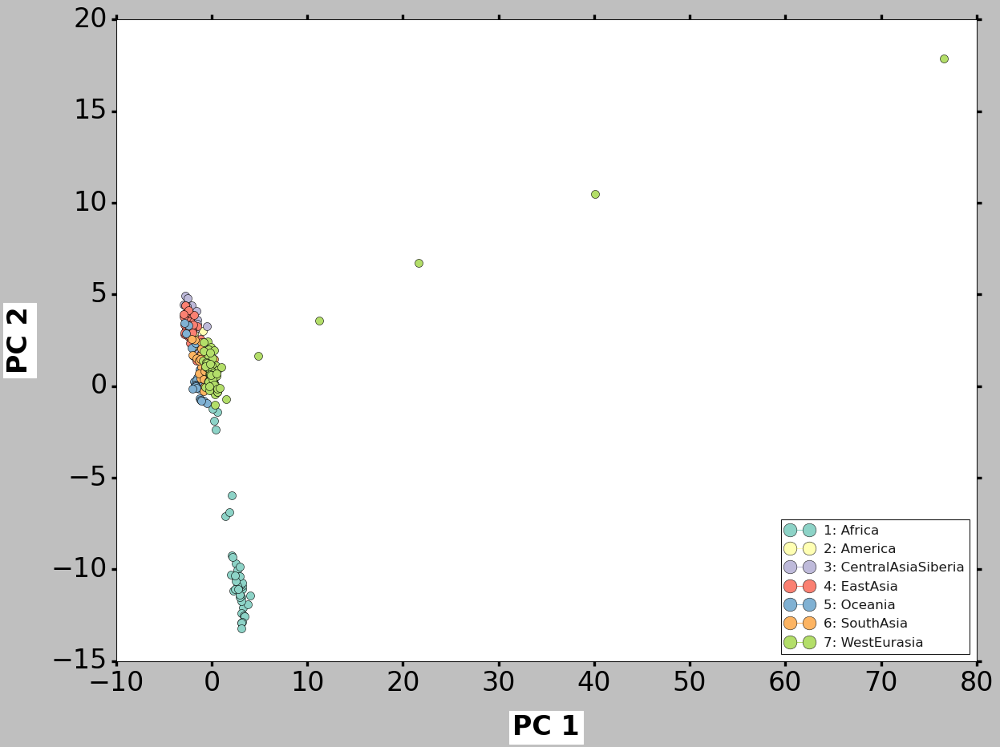

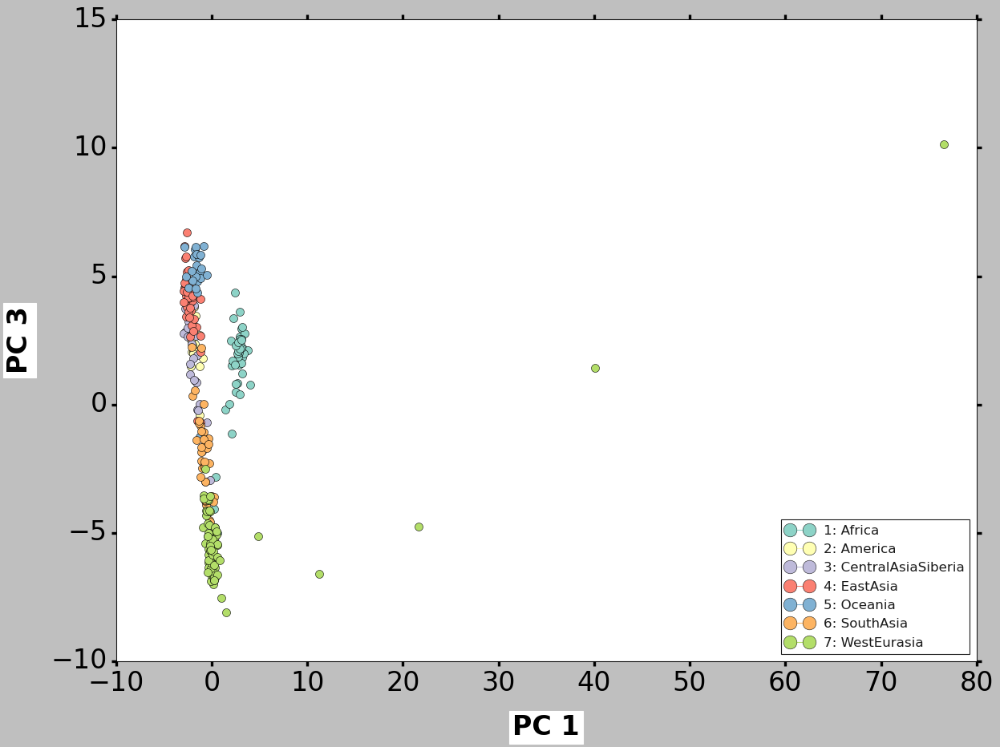

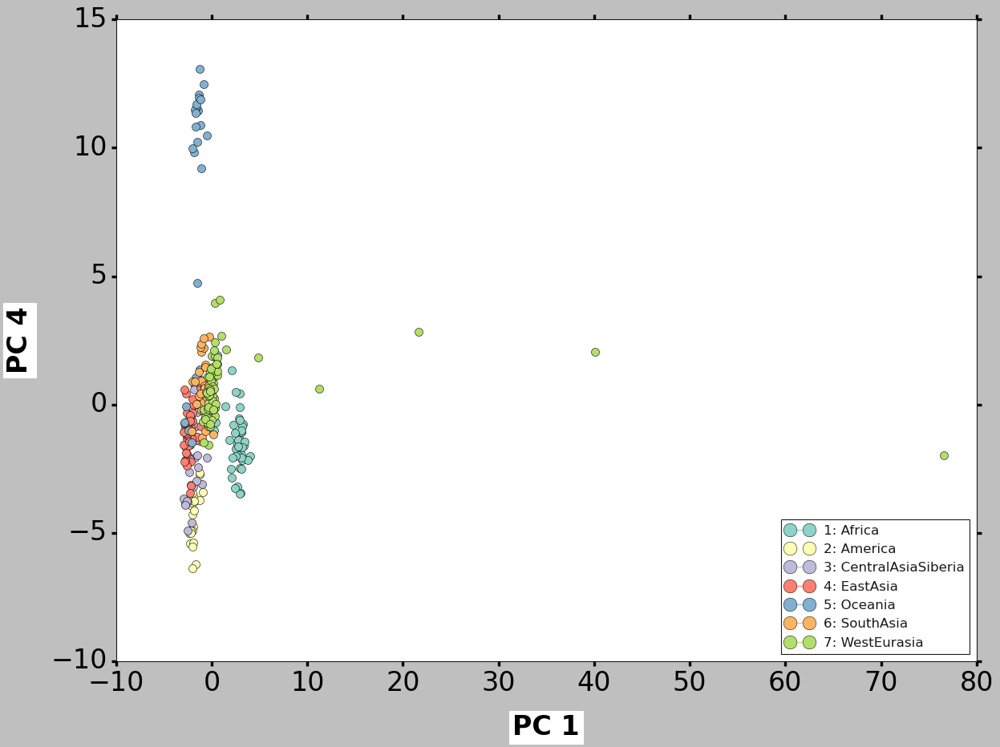

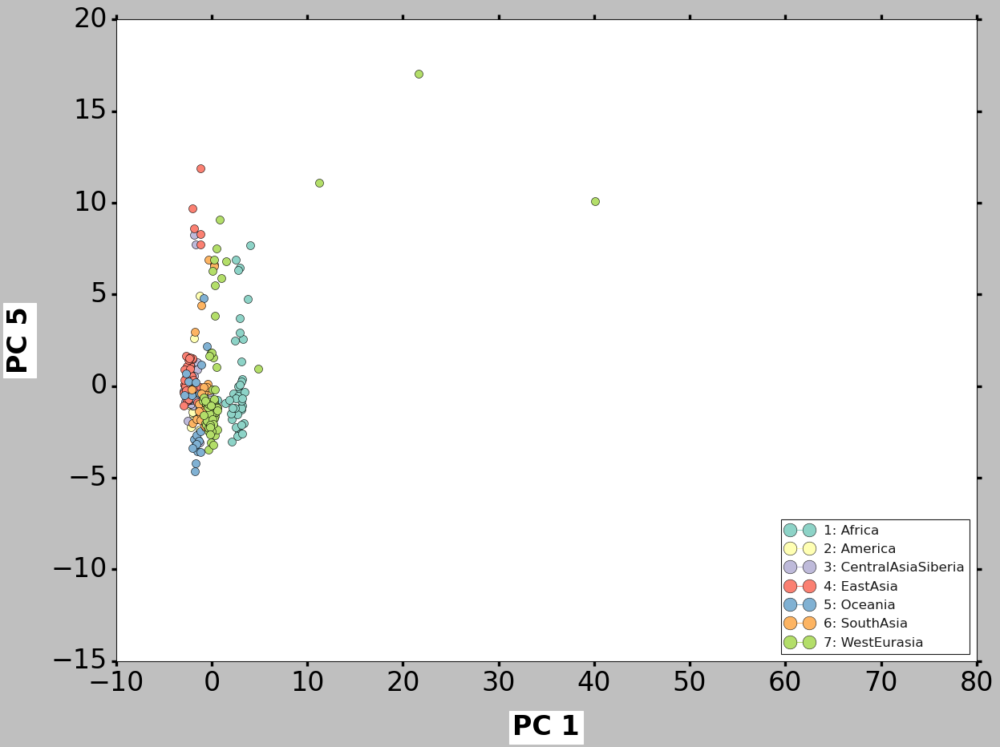

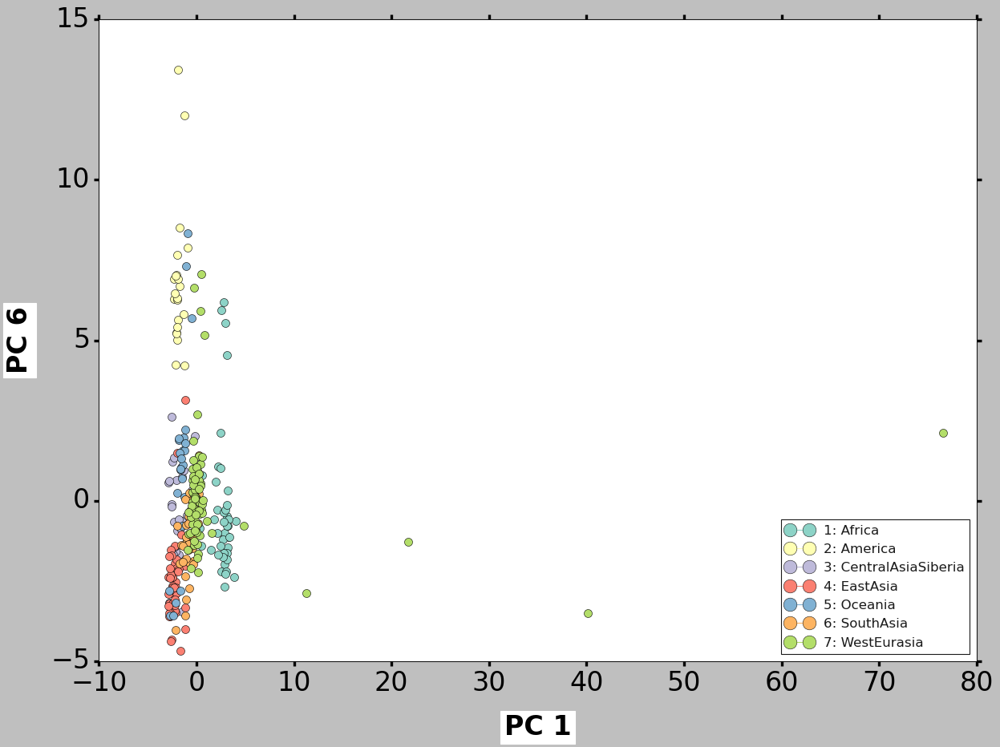

...

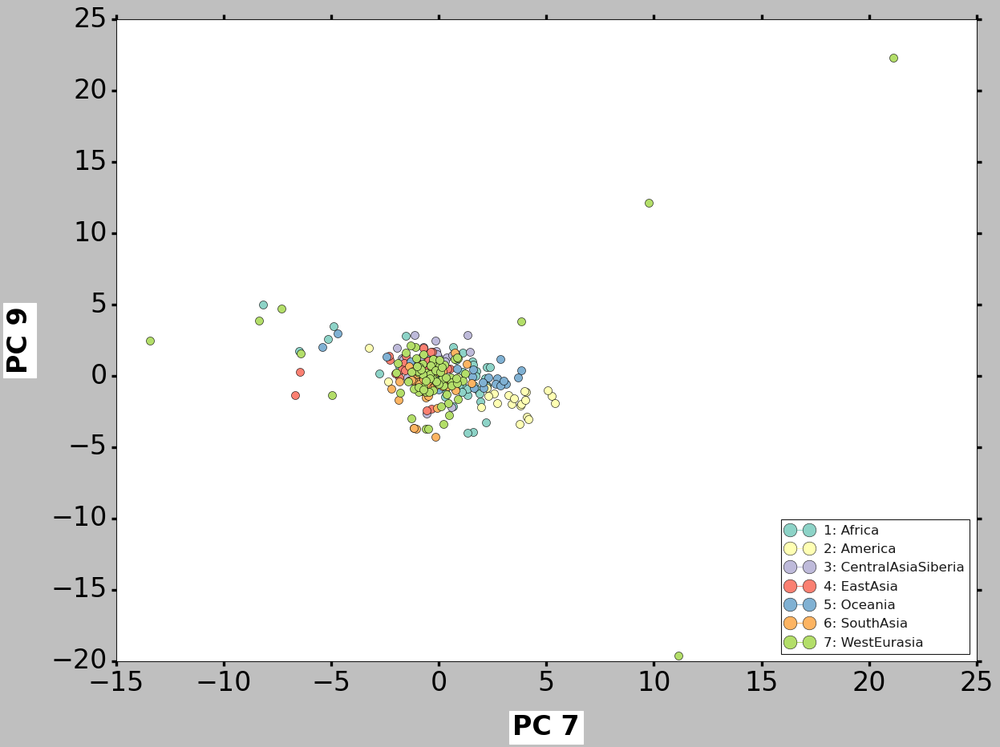

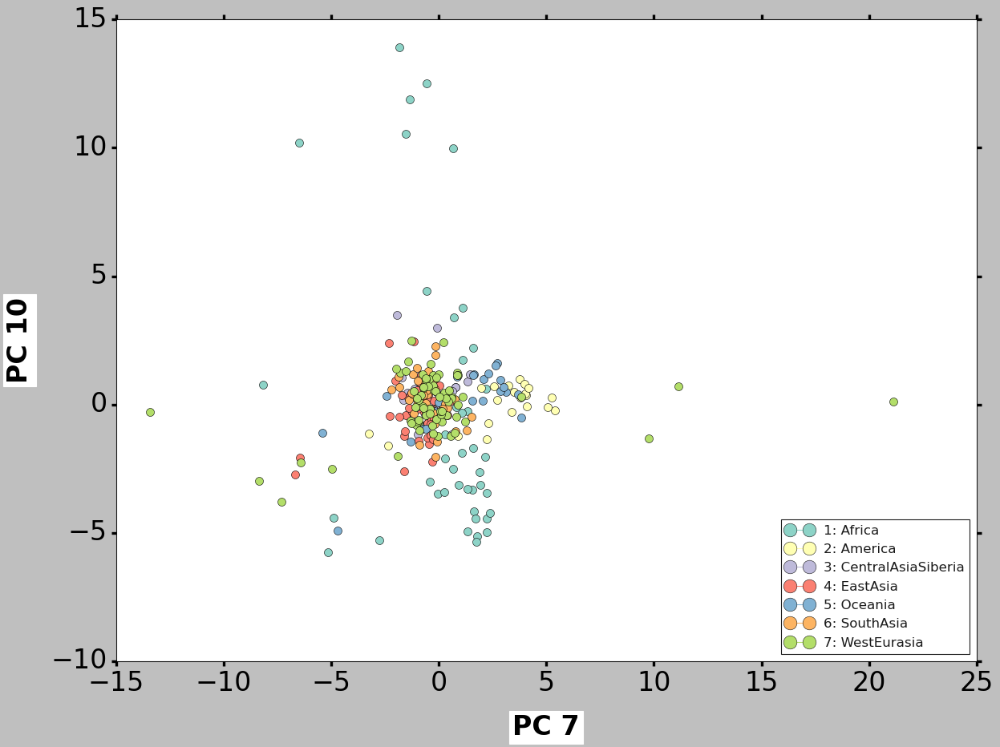

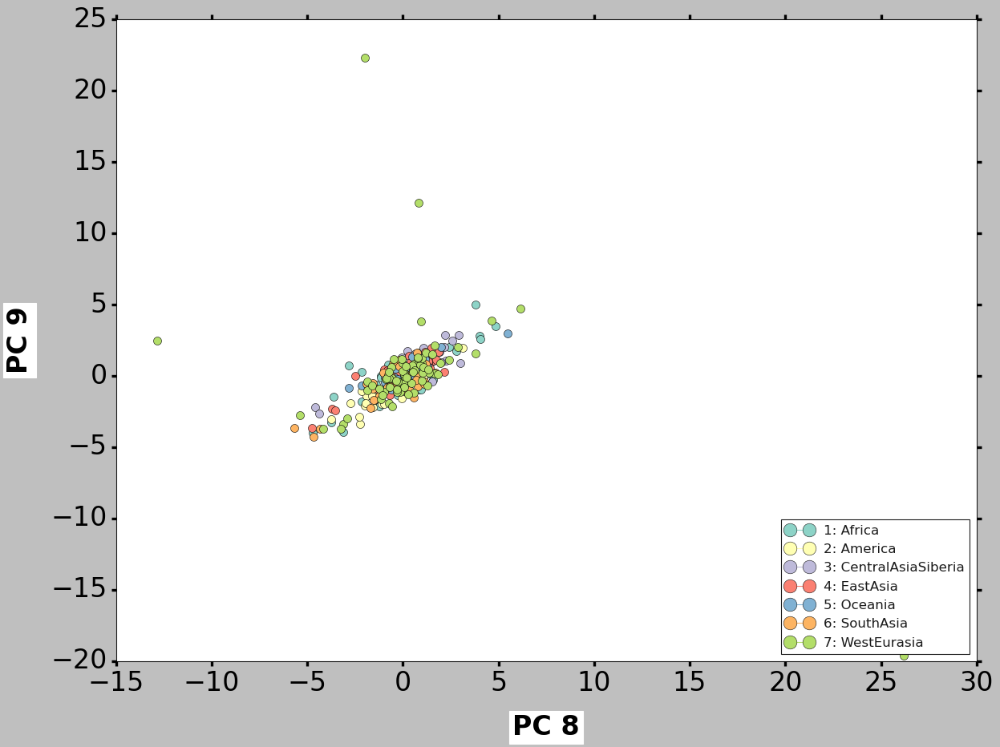

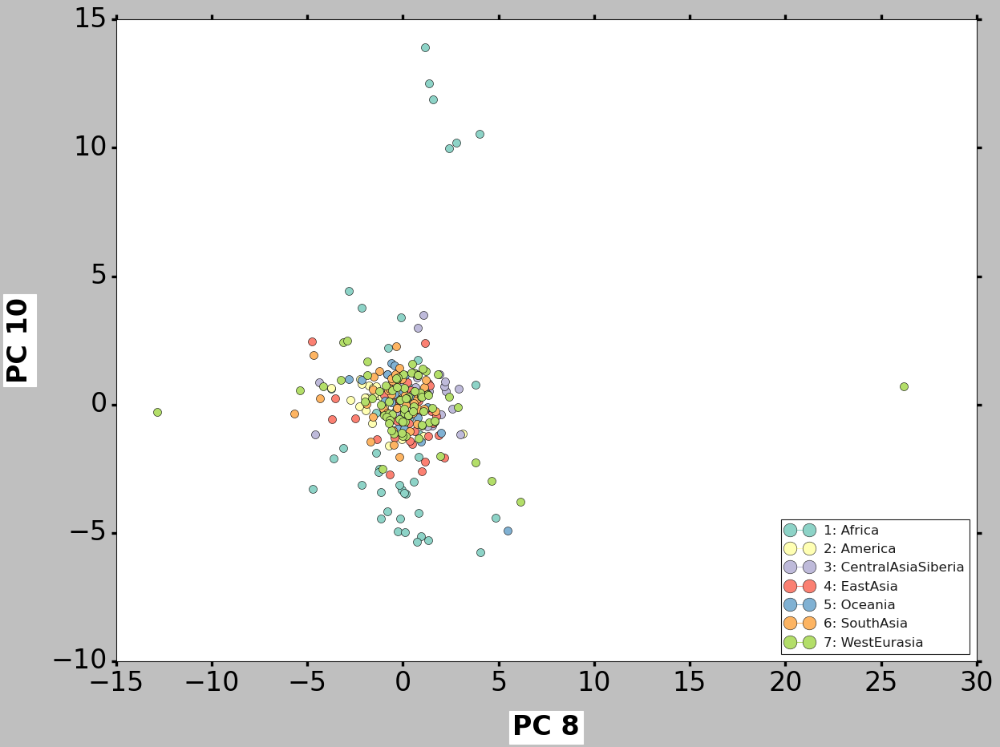

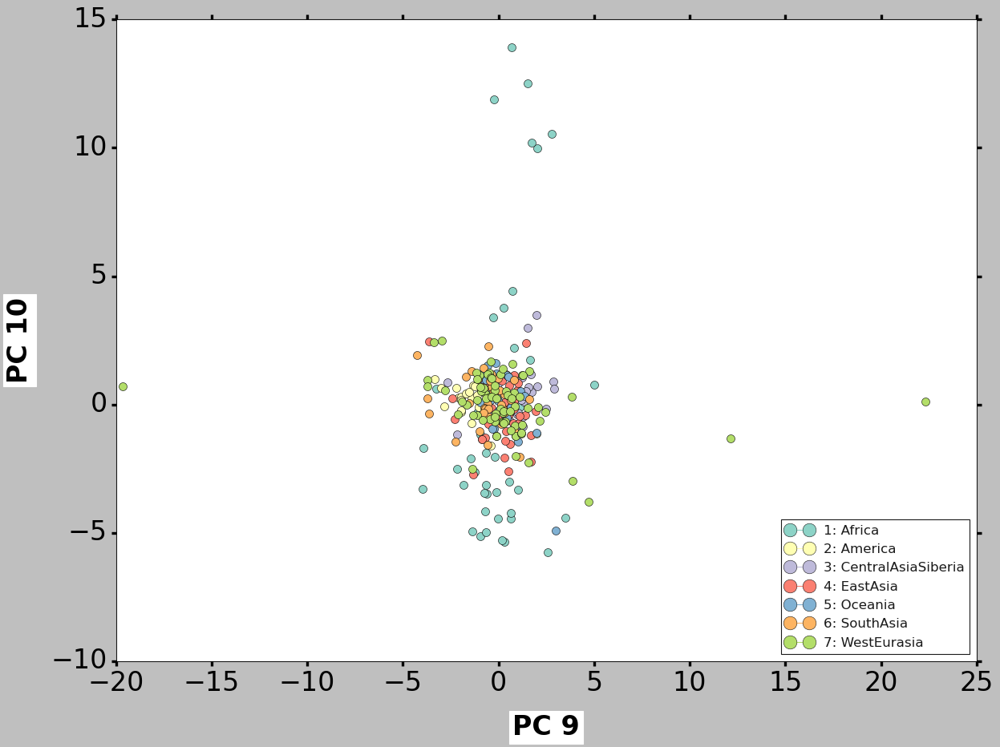

In [103]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC 1', label_vertical='PC 2', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC 2', label_vertical='PC 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)